<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Project 3

### Regression and Classification with the Ames Housing Data

---

You have just joined a new "full stack" real estate company in Ames, Iowa. The strategy of the firm is two-fold:
- Own the entire process from the purchase of the land all the way to sale of the house, and anything in between.
- Use statistical analysis to optimize investment and maximize return.

The company is still small, and though investment is substantial the short-term goals of the company are more oriented towards purchasing existing houses and flipping them as opposed to constructing entirely new houses. That being said, the company has access to a large construction workforce operating at rock-bottom prices.

This project uses the [Ames housing data recently made available on kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques).

In [1]:
# Import required modules
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from pandas_summary import DataFrameSummary
# from pprint import pprint
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, cross_val_predict, train_test_split, KFold
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, Ridge, Lasso
from sklearn.metrics import mean_squared_error

# plt.style.use('ggplot')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

#sns.set_style("whitegrid")

In [2]:
# Set matplotlib plotting parameters

# Resert paramaters to default, before reassigning
plt.rcParams.update(plt.rcParamsDefault)   

plt.rcParams.update({'axes.facecolor': 'white',
                     'axes.titlesize': 8,
                     'axes.edgecolor': 'black',
                     'axes.linewidth': 0.6,
                     'axes.titlepad': 8,
                     'axes.labelsize': 8,
                     'axes.labelpad': 8,
                     'xtick.labelsize':8,
                     'ytick.labelsize':8,
                     'legend.fontsize': 8,
                     'legend.edgecolor': 'black',
                     'legend.loc': 'lower right',
                     'legend.framealpha': 1 })

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 1. Estimating the value of homes from fixed characteristics.

---

Your superiors have outlined this year's strategy for the company:
1. Develop an algorithm to reliably estimate the value of residential houses based on *fixed* characteristics.
2. Identify characteristics of houses that the company can cost-effectively change/renovate with their construction team.
3. Evaluate the mean dollar value of different renovations.

Then we can use that to buy houses that are likely to sell for more than the cost of the purchase plus renovations.

Your first job is to tackle #1. You have a dataset of housing sale data with a huge amount of features identifying different aspects of the house. The full description of the data features can be found in a separate file:

    housing.csv
    data_description.txt
    
You need to build a reliable estimator for the price of the house given characteristics of the house that cannot be renovated. Some examples include:
- The neighborhood
- Square feet
- Bedrooms, bathrooms
- Basement and garage space

and many more. 

Some examples of things that **ARE renovate-able:**
- Roof and exterior features
- "Quality" metrics, such as kitchen quality
- "Condition" metrics, such as condition of garage
- Heating and electrical components

and generally anything you deem can be modified without having to undergo major construction on the house.

---

**Your goals:**
1. Perform any cleaning, feature engineering, and EDA you deem necessary.
- Be sure to remove any houses that are not residential from the dataset.
- Identify **fixed** features that can predict price.
- Train a model on pre-2010 data and evaluate its performance on the 2010 houses.
- Characterize your model. How well does it perform? What are the best estimates of price?

> **Note:** The EDA and feature engineering component to this project is not trivial! Be sure to always think critically and creatively. Justify your actions! Use the data description file!

## Exploratory Analysis

In [3]:
# Load the data
house = pd.read_csv('./housing.csv')

### READ DATA

In [4]:
house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


#### Display different 'Types' of properties, indicated by the MSZoning field

In [5]:
print(house.MSZoning.unique())           # Print unique values in MSZoning field
print(house.MSZoning.value_counts())     # Print count of unique values in MSZoning field

['RL' 'RM' 'C (all)' 'FV' 'RH']
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64


As per data dictionary, properties flagged as RL, RM, and RH are residential.  Therefore, the rest we do not need to worry and will be excluded from the analysis.

####  Remove non Residential property from the Data Frame

In [6]:
house_df = house[house.MSZoning.isin(['RL','RM','RP','RH'])].reset_index(drop=True)
house_df.shape

(1385, 81)

In [7]:
house_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [8]:
house_df.info

<bound method DataFrame.info of         Id  MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0        1          60       RL         65.0     8450   Pave   NaN      Reg   
1        2          20       RL         80.0     9600   Pave   NaN      Reg   
2        3          60       RL         68.0    11250   Pave   NaN      IR1   
3        4          70       RL         60.0     9550   Pave   NaN      IR1   
4        5          60       RL         84.0    14260   Pave   NaN      IR1   
5        6          50       RL         85.0    14115   Pave   NaN      IR1   
6        7          20       RL         75.0    10084   Pave   NaN      Reg   
7        8          60       RL          NaN    10382   Pave   NaN      IR1   
8        9          50       RM         51.0     6120   Pave   NaN      Reg   
9       10         190       RL         50.0     7420   Pave   NaN      Reg   
10      11          20       RL         70.0    11200   Pave   NaN      Reg   
11      12          

#### Check NaN Values that is Greater than 0 in the Columns only

In [9]:
nans = pd.isnull(house_df).sum()
nans[nans>0]

LotFrontage      251
Alley           1320
MasVnrType         5
MasVnrArea         5
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      641
GarageType        79
GarageYrBlt       79
GarageFinish      79
GarageQual        79
GarageCond        79
PoolQC          1378
Fence           1108
MiscFeature     1333
dtype: int64

#### Analysis of Percentage of NaN in the Column

In [10]:
# print value counts for all 'objects' with more than 1 null value
def object_vcs_and_nulls(house_df):
  for i in house_df:
    if house_df[i].dtype == 'O':
      if house_df[i].isnull().sum() > 0:
        print(house_df[i].value_counts())  
        print("Number of Null Values: " + str(house_df[i].isnull().sum()))
        print("Percentage of Nulls = " + str(np.round((house_df[i].isnull().sum() / 14.60), 2)) + "%")
        print("\n")
      
object_vcs_and_nulls(house_df)

Grvl    50
Pave    15
Name: Alley, dtype: int64
Number of Null Values: 1320
Percentage of Nulls = 90.41%


None       816
BrkFace    432
Stone      117
BrkCmn      15
Name: MasVnrType, dtype: int64
Number of Null Values: 5
Percentage of Nulls = 0.34%


TA    639
Gd    561
Ex    113
Fa     35
Name: BsmtQual, dtype: int64
Number of Null Values: 37
Percentage of Nulls = 2.53%


TA    1242
Gd      61
Fa      43
Po       2
Name: BsmtCond, dtype: int64
Number of Null Values: 37
Percentage of Nulls = 2.53%


No    897
Av    210
Gd    134
Mn    106
Name: BsmtExposure, dtype: int64
Number of Null Values: 38
Percentage of Nulls = 2.6%


Unf    397
GLQ    385
ALQ    218
BLQ    145
Rec    129
LwQ     74
Name: BsmtFinType1, dtype: int64
Number of Null Values: 37
Percentage of Nulls = 2.53%


Unf    1181
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64
Number of Null Values: 38
Percentage of Nulls = 2.6%


SBrkr    1263
FuseA      90
FuseF      27
FuseP   

#### Total number of NaN entries in a column must be less than 80% for our Analysis.

In [11]:
 house_df = house_df.loc[:, house_df.isna().sum() < 0.8*house_df.shape[0]]

In [12]:
house_df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
                  ...   
BsmtHalfBath       int64
FullBath           int64
HalfBath           int64
BedroomAbvGr       int64
KitchenAbvGr       int64
KitchenQual       object
TotRmsAbvGrd       int64
Functional        object
Fireplaces         int64


Alley, PoolQC, and MiscFeature are removed from the feature selection on the data frame, as the percentage of NaN are too high to make a meaninful prediction later on.

#### Overview of the Mean Sale Price of each Category

In [13]:
def mean_prices_categorical_var(house_df):
  for i in house_df:
    if house_df[i].dtype == 'O':
      print(house_df.groupby(i, as_index=True)[['SalePrice']].mean() )  
      print("\n")
      
print(mean_prices_categorical_var(house_df))

              SalePrice
MSZoning               
RH        131558.375000
RL        191004.994787
RM        126316.830275


            SalePrice
Street               
Grvl    161037.500000
Pave    180191.601738


              SalePrice
LotShape               
IR1       205808.818182
IR2       243851.789474
IR3       216036.500000
Reg       162863.944444


                 SalePrice
LandContour               
Bnk          144509.096774
HLS          234161.653061
Low          210082.352941
Lvl          178961.666935


               SalePrice
Utilities               
AllPub     180167.089595
NoSeWa     137500.000000


               SalePrice
LotConfig               
Corner     181400.633858
CulDSac    222725.096774
FR2        179411.931818
FR3        216666.666667
Inside     175737.065590


               SalePrice
LandSlope               
Gtl        178863.261069
Mod        201950.806452
Sev        204379.230769


                  SalePrice
Neighborhood               
Blmngtn       19

#### Based on the Overview  further Analysis of the Mean Sale Price by Neighbourhood as our point of interest

In [14]:
mean_price_by_neighborhood = house_df.groupby('Neighborhood', as_index=True)[['SalePrice']].mean()

In [15]:
mean_price_by_neighborhood.sort_values('SalePrice')

,SalePrice
Neighborhood,
MeadowV,98576.470588
BrDale,104493.750000
IDOTRR,110471.428571
BrkSide,124834.051724
OldTown,128174.633929
Edwards,128219.700000
Sawyer,136793.135135
Blueste,137500.000000
SWISU,142591.360000


We found that the lowest house Value in the Neighbourhood is MeadowV with mean Value of \$98,576 and the Highest Mean Value of  \$335,295 at NoRidge.

In [16]:
median_price_by_neighbourhood = house_df.groupby('Neighborhood', as_index=True)[['SalePrice']].median()

In [17]:
median_price_by_neighbourhood.sort_values('SalePrice')

,SalePrice
Neighborhood,
MeadowV,88000
BrDale,106000
IDOTRR,112500
OldTown,118250
Edwards,121750
BrkSide,124300
Sawyer,135000
Blueste,137500
SWISU,139500


As per mean value in the Neighbourhood above the lowest is MeadowV and highest NridgHt

#### Analyse the Neighborhood areas base on their Square Foot of their Living Areas and get their Mean Price per Square Foot

In [18]:
house_df['TotalLivingSF'] = house_df['GrLivArea'] + house_df['TotalBsmtSF'] - house_df['LowQualFinSF']

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [19]:
mean_price_per_squarefoot = house_df.groupby('Neighborhood', 
        as_index=True)['SalePrice'].mean()  / house_df.groupby('Neighborhood', as_index=True)['TotalLivingSF'].mean()

In [20]:
df_mean = pd.DataFrame(mean_price_per_squarefoot)

In [21]:
mean_price_per_squarefoot.sort_values()


Neighborhood
SWISU      56.219783
OldTown    56.757043
Edwards    57.244515
MeadowV    57.569824
IDOTRR     58.152695
BrDale     60.503746
NAmes      62.495892
Sawyer     62.675327
BrkSide    63.704292
NPkVill    65.273189
Mitchel    65.414034
NWAmes     65.605563
Blueste    67.700640
Blmngtn    70.801560
ClearCr    70.917618
SawyerW    71.135475
Crawfor    74.769681
CollgCr    75.041421
Gilbert    76.844541
Timber     78.046283
Somerst    80.475225
Veenker    83.460439
NoRidge    83.769175
NridgHt    89.880781
StoneBr    91.267401
dtype: float64

When Calculating per Square foot living Area compared to the sales Price StoneBr has the highest per square foot of Living space

#### Find Correlations of Sales Price to Features, instead of doing a heatmap it's quicker to view and list the highest and lowest correlation on a list.

In [22]:
corr_list = sorted(house_df.corr().to_dict()['SalePrice'].items(), key = lambda x: x[1], reverse=True)
corr_list

[('SalePrice', 1.0),
 ('OverallQual', 0.7909855412380907),
 ('TotalLivingSF', 0.7831485781003689),
 ('GrLivArea', 0.7084991311351482),
 ('GarageCars', 0.6409538645755205),
 ('GarageArea', 0.6290484378586555),
 ('TotalBsmtSF', 0.6175360502833692),
 ('1stFlrSF', 0.6170591324139126),
 ('FullBath', 0.557076727494886),
 ('TotRmsAbvGrd', 0.5362497505040191),
 ('YearBuilt', 0.5174661781053508),
 ('MasVnrArea', 0.5129993468159387),
 ('YearRemodAdd', 0.4992082120728558),
 ('GarageYrBlt', 0.4864692044892095),
 ('Fireplaces', 0.4717023886009298),
 ('BsmtFinSF1', 0.3945097548501988),
 ('LotFrontage', 0.3575290045117639),
 ('WoodDeckSF', 0.3256704048087276),
 ('OpenPorchSF', 0.3244832088526166),
 ('2ndFlrSF', 0.3188337436005306),
 ('HalfBath', 0.2830884739572656),
 ('LotArea', 0.27095537241522843),
 ('BsmtFullBath', 0.2291339054876021),
 ('BsmtUnfSF', 0.21285770814108912),
 ('BedroomAbvGr', 0.16326653242937458),
 ('ScreenPorch', 0.11610960725311399),
 ('PoolArea', 0.09502865148890538),
 ('MoSold', 

As we can quickly see that the highest positively Correlated are the OverallQual and TotalLivingSF, at this point ID should be drop from the data frame for analysis.

In [23]:
house_df = house_df.drop(['Id'], axis=1)

In [24]:
house_df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'WoodDeckSF'

#### Start by understanding the SalePrice column, since this is the target variable

In [25]:
house_dfs = DataFrameSummary(house_df)
house_dfs['SalePrice']

mean                                                                   180136
std                                                                   79906.4
variance                                                          6.38503e+09
min                                                                     37900
max                                                                    755000
5%                                                                    89476.8
25%                                                                    129000
50%                                                                    160000
75%                                                                    212900
95%                                                                    325925
iqr                                                                     83900
kurtosis                                                               6.7934
skewness                                                        

We've already did a review of the Mean of Sales Price by Categories and looked at the Mean Sales price by neighbourhood.  Pandas DataFrameSummary is a quick overview of what has been analyse or use this method on the inital analysis.  From the summary we note that this view gives us the top correlation within the data which is OverallQual and TotalLivingSF the additional Column we created.

C:\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


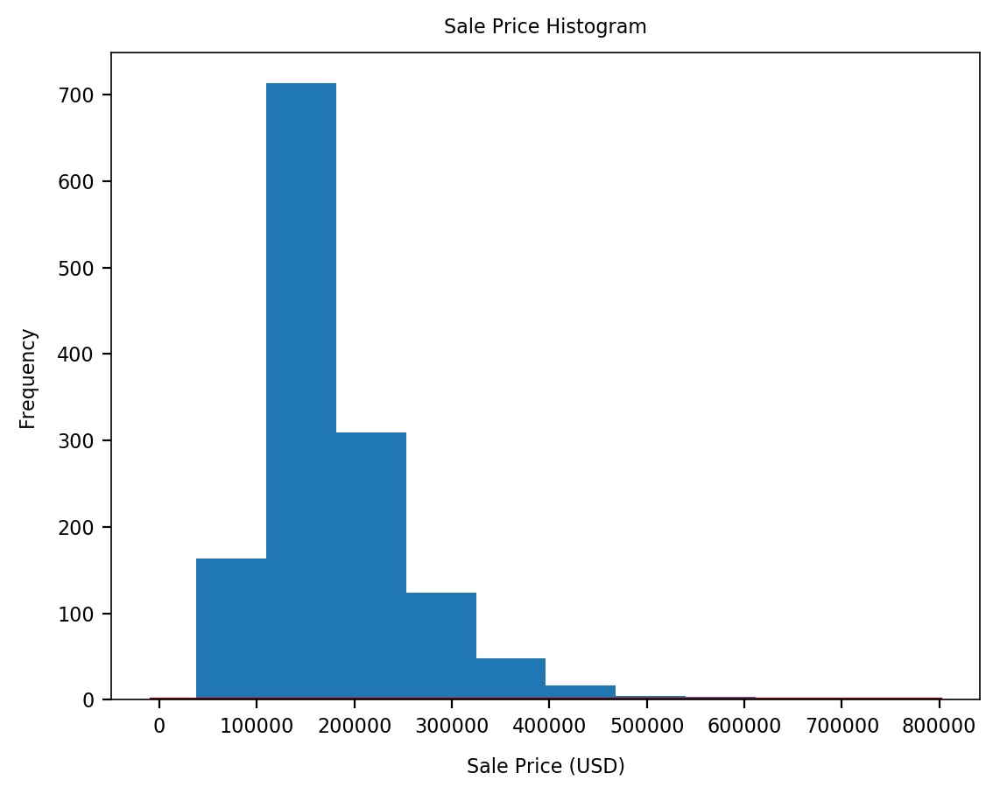

In [26]:

ax = sns.distplot(house_df['SalePrice'], color='red', bins=10, hist_kws=dict(alpha=1), kde_kws={"color": "darkred"})
ax.set_xlabel('Sale Price (USD)')
ax.set_title('Sale Price Histogram')
plt.show()

### Removing this section as will not be used again
We see that the distribution is positively skewed. We'll apply a logarithmic transformation to the ‘SalePrice’ variable to see if we can transform it to become more normally distributed.  ==>  Ditch this one

In [80]:
#house_df['SalePrice'] = np.log1p(house_df['SalePrice'])

#ax = sns.distplot([house_df('SalePrice')], color='red', bins=10, hist_kws=dict(alpha=1), kde_kws={"color": "darkred"})
#ax.set_xlabel('Log Sale Price (USD)')
#ax.set_title('Log Sale Price Histogram')
#plt.show()

The transformation creates a much more normally distributed histogram, which will use later during the linear regression phase.

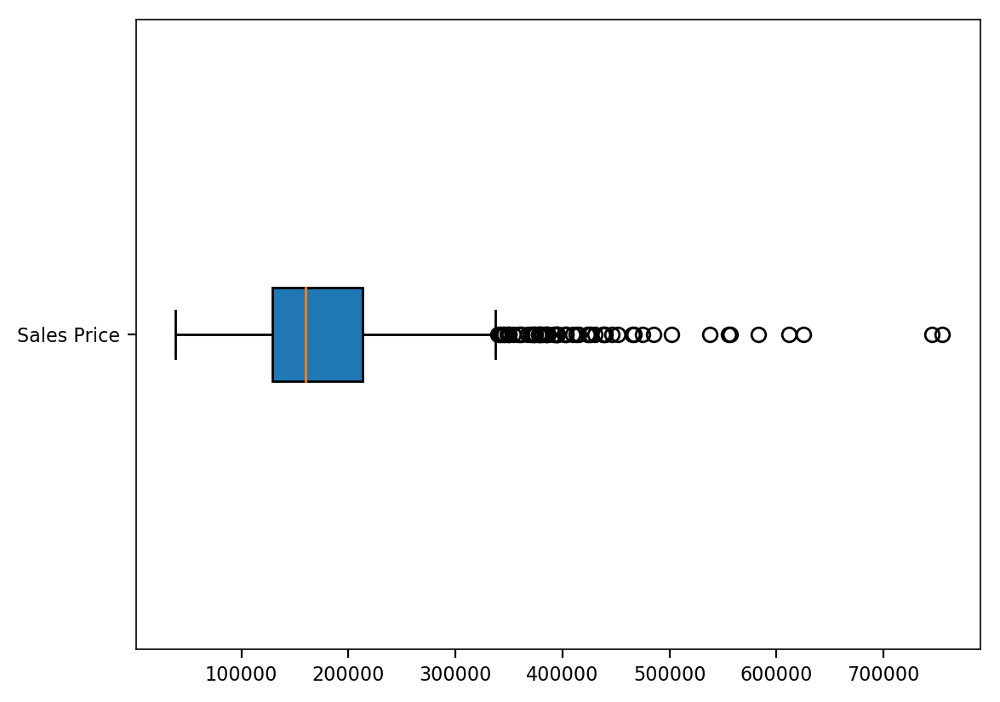

In [27]:
box_plot_data= house_df['SalePrice']
box=plt.boxplot(box_plot_data,vert=0,patch_artist=True,labels=['Sales Price'],
            )

plt.show()

After the Transformation we can see on BoxPlot the Outlier of the Sales Prices.

Plot the number of houses sold by neighborhood in Ames, Iowa, and see how they stack up.

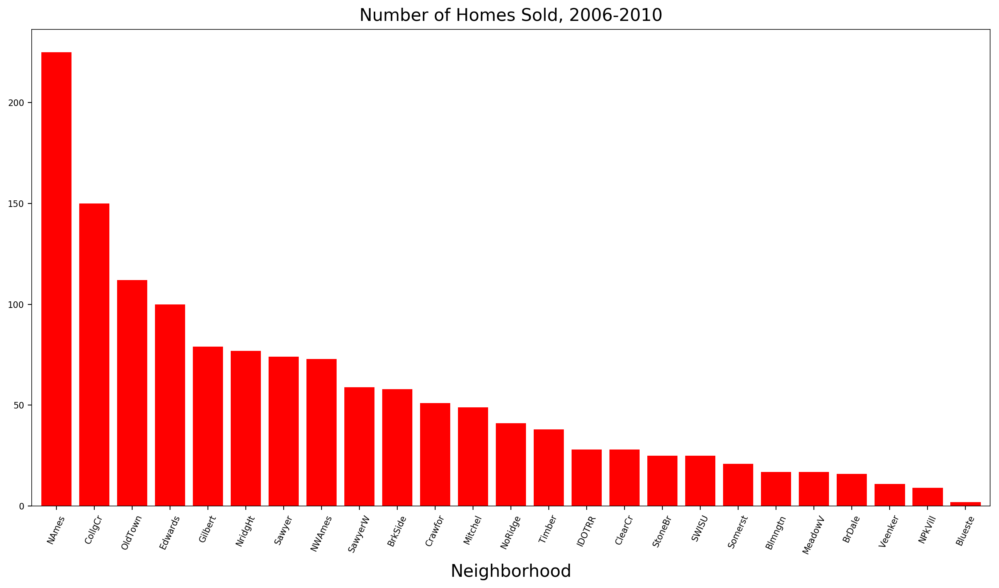

In [28]:
ax = house_df.groupby('Neighborhood')['SalePrice'].count().to_frame().sort_values('SalePrice', ascending = False).plot(kind = 'bar', rot=65, figsize=(16,8), width=.8, color='r', legend=False)
ax.set_xlabel('Neighborhood', fontsize=16)
ax.set_title('Number of Homes Sold, 2006-2010', fontsize=16)
plt.show()

The neighborhoods with the most sales (e.g., North Ames, College Creek, Old Town, Edwards, Gilbert)

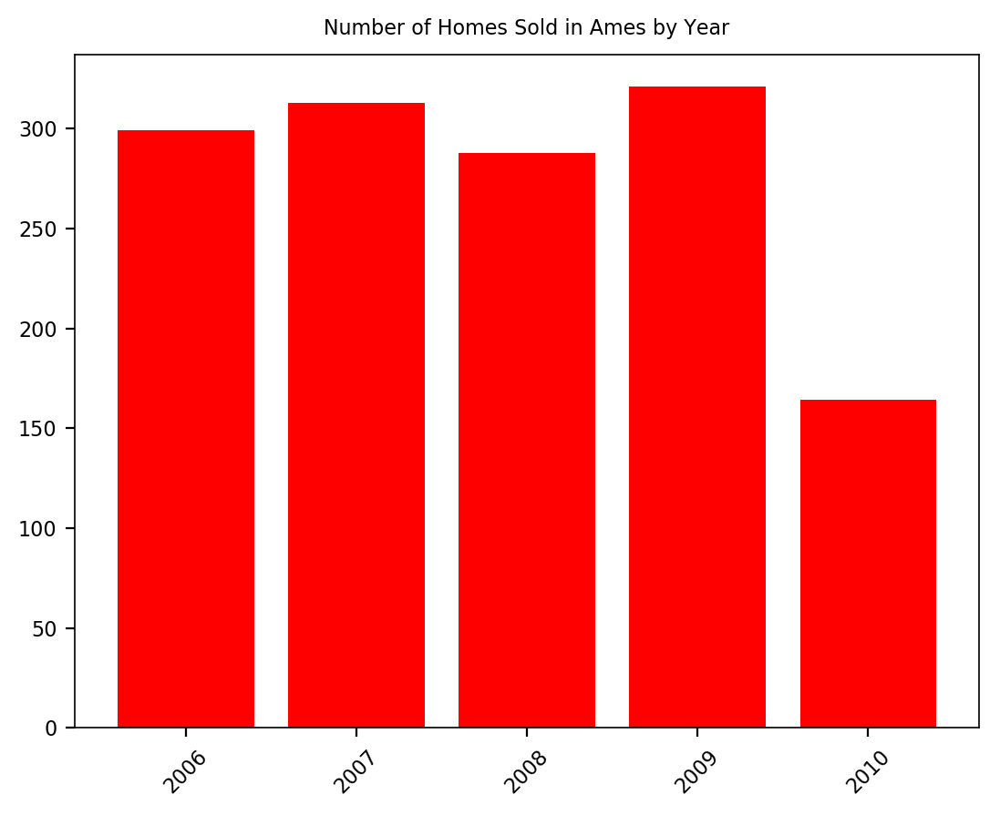

In [29]:
house_df['YrSold'].value_counts().sort_index().plot(kind = 'bar', width=.8, color='r', rot=45).set_title('Number of Homes Sold in Ames by Year')
plt.show();

Before we start Modeling some of the numerical features have outliers, which we need to deal with, therefore we'll calculate the skew of the numeric columns.

### Selecting our Features for Analysis

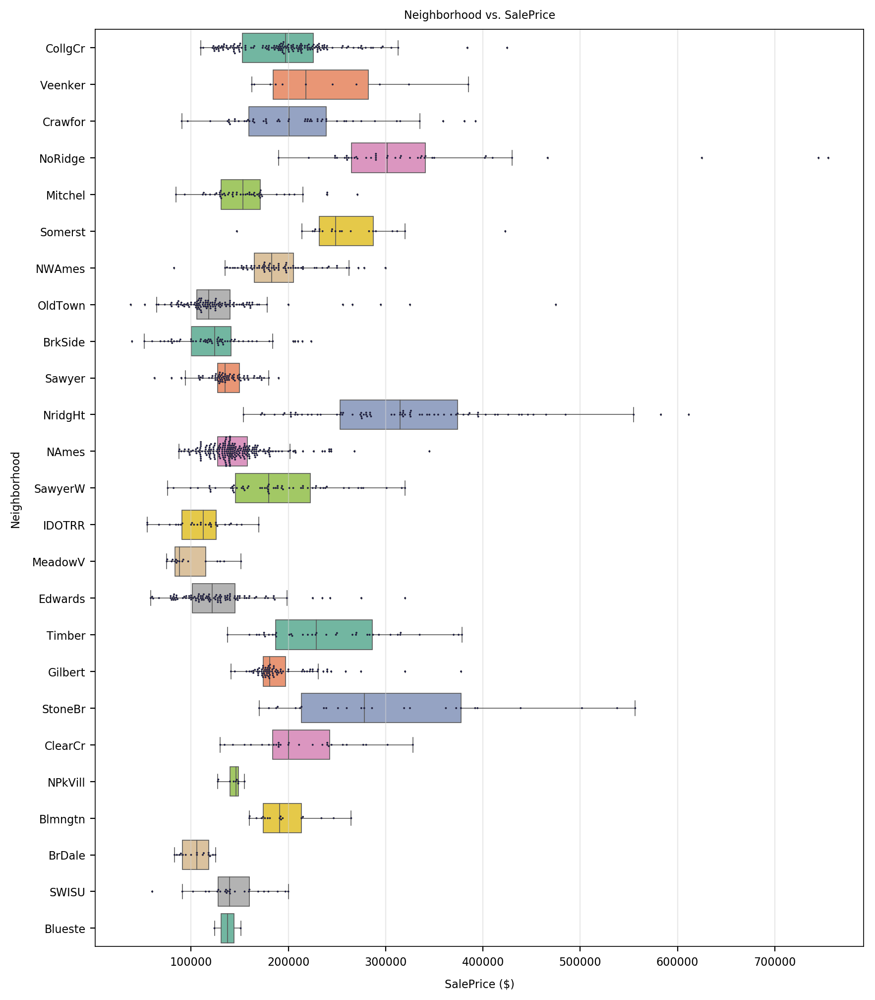

In [30]:
# Plot a box and swarm plot of Neighborhood vs. SalePrice
fig, ax = plt.subplots(figsize=(10,12))
y_axis = 'Neighborhood'
x_axis = 'SalePrice'

ax = sns.boxplot(x=x_axis, y=y_axis, data=house_df, linewidth=0.6, orient='h', fliersize=0.2, palette='Set2')
ax = sns.swarmplot(x=x_axis, y=y_axis, data=house_df, linewidth=0.4, size=1, color='darkblue')

# Add a vertical grid to the plot, but make it light in color
ax.xaxis.grid(True, linestyle='-', which='both', color='lightgrey', alpha=0.5)

ax.set_title(f'{y_axis} vs. {x_axis}')
ax.set_xlabel(f'{x_axis} ($)')
ax.set_ylabel(y_axis) 
plt.show()

Neighborhood will be a predictors. There is a good distribution of data across the different neighborhoods, and there is a significant variation in sales price across the different category values.

In [31]:
Feature_Field = ['LotArea','TotalLivingSF', 'Utilities', 'Neighborhood', 'BldgType', 'GarageCars', 'Fireplaces', 'WoodDeckSF','OpenPorchSF','HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'GrLivArea', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'MoSold', 'YrSold', 'SalePrice']
house_features = pd.DataFrame(house_df, columns=Feature_Field)

In [32]:
house_features.head()

,LotArea,TotalLivingSF,Utilities,Neighborhood,BldgType,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,HouseStyle,...,RoofStyle,RoofMatl,GrLivArea,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,MoSold,YrSold,SalePrice
0,8450,2566,AllPub,CollgCr,1Fam,2,0,0,61,2Story,...,Gable,CompShg,1710,2,1,3,1,2,2008,208500
1,9600,2524,AllPub,Veenker,1Fam,2,1,298,0,1Story,...,Gable,CompShg,1262,2,0,3,1,5,2007,181500
2,11250,2706,AllPub,CollgCr,1Fam,2,1,0,42,2Story,...,Gable,CompShg,1786,2,1,3,1,9,2008,223500
3,9550,2473,AllPub,Crawfor,1Fam,3,1,0,35,2Story,...,Gable,CompShg,1717,1,0,3,1,2,2006,140000
4,14260,3343,AllPub,NoRidge,1Fam,3,1,192,84,2Story,...,Gable,CompShg,2198,2,1,4,1,12,2008,250000


In [33]:
from scipy.stats import skew

In [34]:
num_cols = ['LotArea','OverallQual','OverallCond','YearBuilt','YearRemodAdd','GrLivArea','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','MoSold','YrSold']
for i in num_cols:
    print (i, skew(house_features[i]))

LotArea 12.049139631921818
OverallQual 0.29244915194382737
OverallCond 0.6603657551990001
YearBuilt -0.5773086760456465
YearRemodAdd -0.44771759729453586
GrLivArea 1.376498708979219
FullBath 0.10412950812580192
HalfBath 0.7499236851687241
BedroomAbvGr 0.20443591679579812
KitchenAbvGr 4.38939918324068
MoSold 0.210812090538156
YrSold 0.0990478575849845


We found a large positive skews in ‘LotArea’, ‘GrLivArea’ and ‘KitchenAbvGr’, so we apply a logarithmic transformation to these features.

In [35]:
house_features['LotArea'] = np.log1p(house_df['LotArea'])
house_features['GrLivArea'] = np.log1p(house_df['GrLivArea'])
house_features['KitchenAbvGr'] = np.log1p(house_df['KitchenAbvGr'])

In [36]:
house_features.head()

,LotArea,TotalLivingSF,Utilities,Neighborhood,BldgType,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,HouseStyle,...,RoofStyle,RoofMatl,GrLivArea,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,MoSold,YrSold,SalePrice
0,9.042040,2566,AllPub,CollgCr,1Fam,2,0,0,61,2Story,...,Gable,CompShg,7.444833,2,1,3,0.693147,2,2008,208500
1,9.169623,2524,AllPub,Veenker,1Fam,2,1,298,0,1Story,...,Gable,CompShg,7.141245,2,0,3,0.693147,5,2007,181500
2,9.328212,2706,AllPub,CollgCr,1Fam,2,1,0,42,2Story,...,Gable,CompShg,7.488294,2,1,3,0.693147,9,2008,223500
3,9.164401,2473,AllPub,Crawfor,1Fam,3,1,0,35,2Story,...,Gable,CompShg,7.448916,1,0,3,0.693147,2,2006,140000
4,9.565284,3343,AllPub,NoRidge,1Fam,3,1,192,84,2Story,...,Gable,CompShg,7.695758,2,1,4,0.693147,12,2008,250000


Create a correlation heatmap so that we can quickly visualize the interdependencies among the features

In [37]:
# Move 'SalePrice' column to end of dataframe
cols = list(house_features)
cols.insert(len(cols), cols.pop(cols.index('SalePrice')))
house_features = house_features.loc[:, cols]
# Double check shape of dataframe
house_features.shape

(1385, 24)

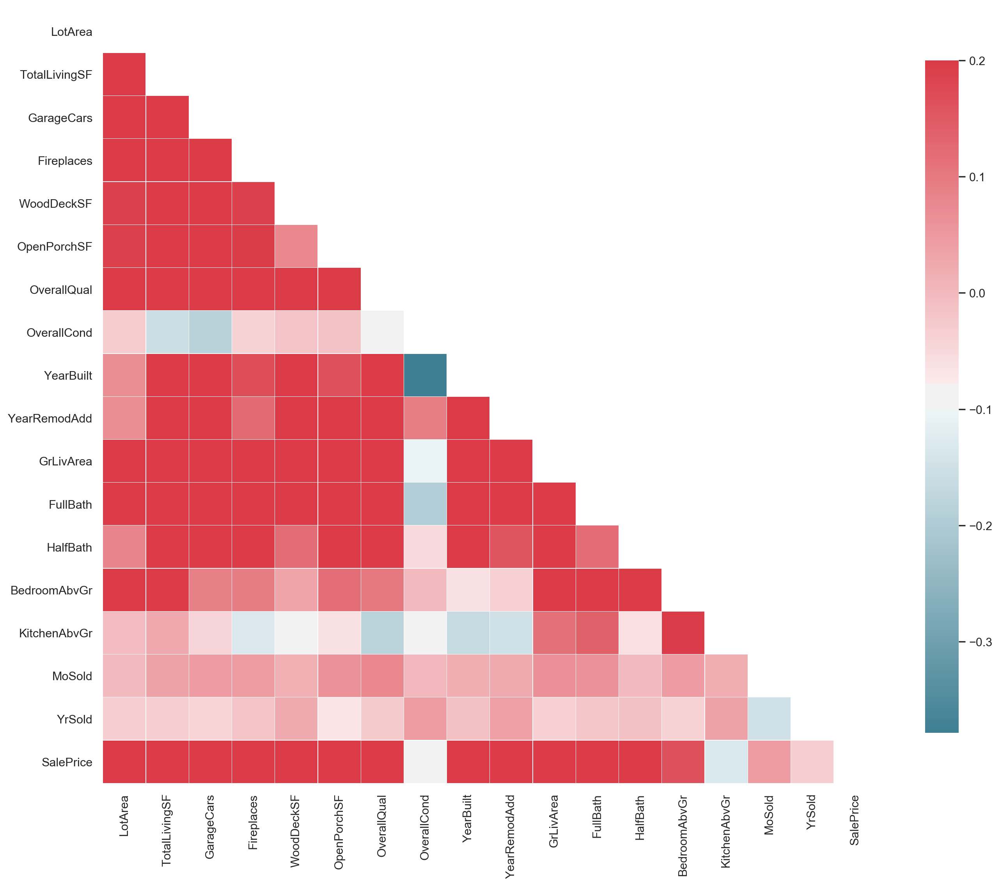

In [38]:
sns.set(style="white")

# Compute the correlation matrix
corr = house_features.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 16))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.2,
            square=True, xticklabels=True, yticklabels=True,
            linewidths=.1, cbar_kws={"shrink": .7}, ax=ax)
plt.show()

### Not Converting as Yet as I  have Errors Later on.

Convert our categorical variables to dummy variables so that we can use them appropriately in our linear regression model.

In [40]:
house_features = pd.get_dummies(house_features, drop_first=True)

In [41]:
house_features.head(10)

,LotArea,TotalLivingSF,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,OverallQual,OverallCond,YearBuilt,YearRemodAdd,...,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl
0,9.042040,2566,2,0,0,61,7,5,2003,2003,...,0,0,0,1,0,0,0,0,0,0
1,9.169623,2524,2,1,298,0,6,8,1976,1976,...,0,0,0,1,0,0,0,0,0,0
2,9.328212,2706,2,1,0,42,7,5,2001,2002,...,0,0,0,1,0,0,0,0,0,0
3,9.164401,2473,3,1,0,35,7,5,1915,1970,...,0,0,0,1,0,0,0,0,0,0
4,9.565284,3343,3,1,192,84,8,5,2000,2000,...,0,0,0,1,0,0,0,0,0,0
5,9.555064,2158,2,0,40,30,5,5,1993,1995,...,0,0,0,1,0,0,0,0,0,0
6,9.218804,3380,2,1,255,57,8,5,2004,2005,...,0,0,0,1,0,0,0,0,0,0
7,9.247925,3197,2,2,235,204,7,6,1973,1973,...,0,0,0,1,0,0,0,0,0,0
8,8.719481,2726,2,2,90,0,7,5,1931,1950,...,0,0,0,1,0,0,0,0,0,0
9,8.912069,2068,1,2,0,4,5,6,1939,1950,...,0,0,0,1,0,0,0,0,0,0


### Not Replotting the HeatMap with the updated Dummy Variables

In [42]:
# Move 'SalePrice' column to end of dataframe
cols = list(house_features)
cols.insert(len(cols), cols.pop(cols.index('SalePrice')))
house_features = house_features.loc[:, cols]
# Double check shape of dataframe
house_features.shape

(1385, 66)

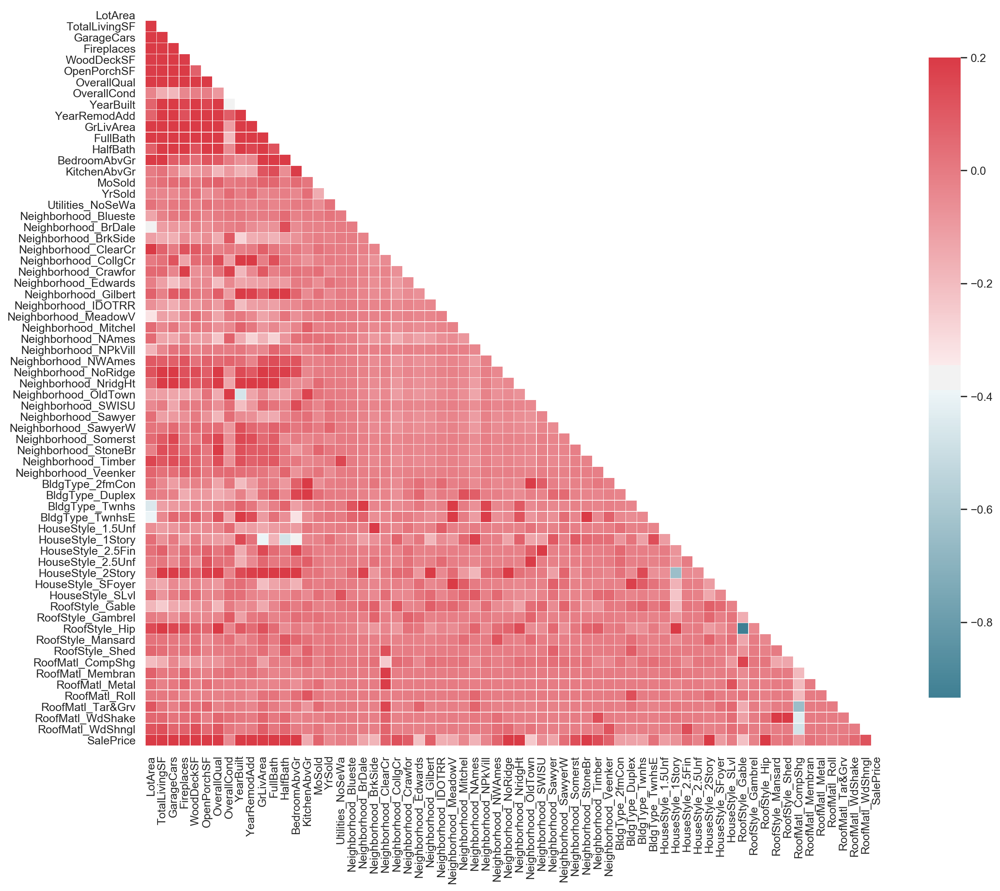

In [43]:
sns.set(style="white")

# Compute the correlation matrix
corr = house_features.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 16))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.2,
            square=True, xticklabels=True, yticklabels=True,
            linewidths=.1, cbar_kws={"shrink": .7}, ax=ax)
plt.show()

Seems like everthing is correlated, not sure why will need to double check if I have made an error or the feature selection after transformation now seems to be very correlated.  To review if need be.  We'll try to see the colleration numerial value as we previously did earlier instead of a heatmap.

In [44]:
corr_list = sorted(house_features.corr().to_dict()['SalePrice'].items(), key=lambda x: x[1], reverse=True)
corr_list

[('SalePrice', 1.0),
 ('OverallQual', 0.8169534232081047),
 ('TotalLivingSF', 0.785186543222453),
 ('GrLivArea', 0.732044966952146),
 ('GarageCars', 0.6861544088432568),
 ('FullBath', 0.5887447716129949),
 ('YearBuilt', 0.5786452626124582),
 ('YearRemodAdd', 0.5532980290207468),
 ('Fireplaces', 0.5013133029795592),
 ('LotArea', 0.4366885167816639),
 ('Neighborhood_NridgHt', 0.368333152880492),
 ('OpenPorchSF', 0.34019705929232685),
 ('WoodDeckSF', 0.3398807924981546),
 ('HalfBath', 0.3105620801784912),
 ('Neighborhood_NoRidge', 0.2901882134393448),
 ('HouseStyle_2Story', 0.2597395608289744),
 ('RoofStyle_Hip', 0.2195877268603224),
 ('BedroomAbvGr', 0.20479618443797312),
 ('Neighborhood_StoneBr', 0.1941737244868072),
 ('Neighborhood_Timber', 0.1460742337619294),
 ('Neighborhood_Somerst', 0.13539309456492432),
 ('Neighborhood_CollgCr', 0.12668632758293782),
 ('RoofMatl_WdShngl', 0.12416231605263627),
 ('Neighborhood_Crawfor', 0.09238386245766944),
 ('Neighborhood_Gilbert', 0.084521008993

Just to make sure the correlation looks the same and as expected with the top correlated Feature as we expected previously.

- ('OverallQual', 0.8169534232081047),
- ('TotalLivingSF', 0.785186543222453),
- ('GrLivArea', 0.732044966952146),
- ('GarageCars', 0.6861544088432568),
- ('FullBath', 0.5887447716129949),
- ('YearBuilt', 0.5786452626124582),
- ('YearRemodAdd', 0.5532980290207468),
- ('Fireplaces', 0.5013133029795592),


####  Plot relationship between predictors and sales price to confirm linear relationship visually

C:\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


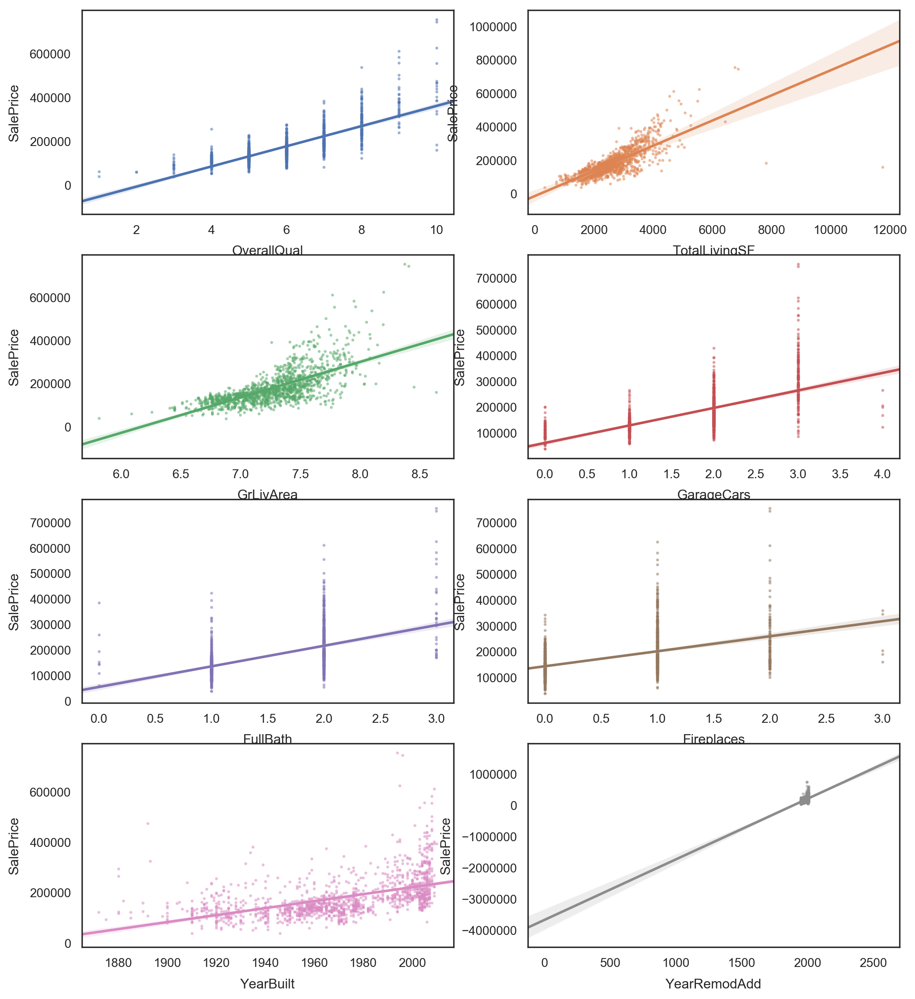

In [39]:
# Plot relationship between predictors and sales price to confirm linear relationship visually
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(13,15))

scatter_dict = {'s':3, 'alpha':0.4}
sns.regplot('OverallQual','SalePrice', house_features, ax=ax[0,0], scatter_kws=scatter_dict) 
sns.regplot('TotalLivingSF','SalePrice', house_features, ax=ax[0,1], scatter_kws=scatter_dict) 
sns.regplot('GrLivArea','SalePrice', house_features, ax=ax[1,0], scatter_kws=scatter_dict) 
sns.regplot('GarageCars','SalePrice', house_features, ax=ax[1,1], scatter_kws=scatter_dict) 
sns.regplot('FullBath','SalePrice', house_features, ax=ax[2,0], scatter_kws=scatter_dict) 
sns.regplot('Fireplaces','SalePrice', house_features, ax=ax[2,1], scatter_kws=scatter_dict) 
sns.regplot('YearBuilt','SalePrice', house_features, ax=ax[3,0], scatter_kws=scatter_dict) 
sns.regplot('YearRemodAdd','SalePrice', house_features, ax=ax[3,1], scatter_kws=scatter_dict) 

# ax[0,1].set_xlim(0,3000)           # I've intentionally restricted some axes (excluding some outliers) 
# ax[0,1].set_xlim(0,3000)           # to enable me to see the relationship more clearly 
# ax[1,0].set_xlim(0,4000)
# ax[3,0].set_xlim(0,600)
# ax[3,1].set_xlim(0,600)  
plt.show() 

### Train and evaluate a model to predict sales price

After some condsideration the original plan of features selection have to be reevaluated, as to answer the original question of finding predictors based on their Numeric and Categorial predictors.  I have eleminated too many predictors and have recondsidered in putting them back for prediction analysis.

#### Proposed numeric predictors: 
['YearRemodAdd', 'TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageCars', 'Fireplaces', 'WoodDeckSF', 'OpenPorchSF']

#### Proposed categorical predictors: 
['Neighborhood', 'LotShape', 'Condition1', 'BldgType', 'HouseStyle', 'Foundation', 'BsmtQual', 'BsmtExposure', 'GarageType']

#### All proposed predictors: 
['YearRemodAdd', 'TotalBsmtSF', 'GrLivArea', 'FullBath', 'GarageCars', 'Fireplaces', 'WoodDeckSF', 'OpenPorchSF', 'Neighborhood', 'LotShape', 'Condition1', 'BldgType', 'HouseStyle', 'Foundation', 'BsmtQual', 'BsmtExposure', 'GarageType']


In [40]:
# Define dictionary of column indexes for ease of identification
col_indexes = dict(enumerate(house_df.columns)) 
print(col_indexes)

{0: 'MSSubClass', 1: 'MSZoning', 2: 'LotFrontage', 3: 'LotArea', 4: 'Street', 5: 'LotShape', 6: 'LandContour', 7: 'Utilities', 8: 'LotConfig', 9: 'LandSlope', 10: 'Neighborhood', 11: 'Condition1', 12: 'Condition2', 13: 'BldgType', 14: 'HouseStyle', 15: 'OverallQual', 16: 'OverallCond', 17: 'YearBuilt', 18: 'YearRemodAdd', 19: 'RoofStyle', 20: 'RoofMatl', 21: 'Exterior1st', 22: 'Exterior2nd', 23: 'MasVnrType', 24: 'MasVnrArea', 25: 'ExterQual', 26: 'ExterCond', 27: 'Foundation', 28: 'BsmtQual', 29: 'BsmtCond', 30: 'BsmtExposure', 31: 'BsmtFinType1', 32: 'BsmtFinSF1', 33: 'BsmtFinType2', 34: 'BsmtFinSF2', 35: 'BsmtUnfSF', 36: 'TotalBsmtSF', 37: 'Heating', 38: 'HeatingQC', 39: 'CentralAir', 40: 'Electrical', 41: '1stFlrSF', 42: '2ndFlrSF', 43: 'LowQualFinSF', 44: 'GrLivArea', 45: 'BsmtFullBath', 46: 'BsmtHalfBath', 47: 'FullBath', 48: 'HalfBath', 49: 'BedroomAbvGr', 50: 'KitchenAbvGr', 51: 'KitchenQual', 52: 'TotRmsAbvGrd', 53: 'Functional', 54: 'Fireplaces', 55: 'FireplaceQu', 56: 'Garag

In [41]:
# Define list of column of indexes of numeric, fixed features of interest for predicting sales price, 
# based on col_indexes dictionary above
ff_col_index = [3, 4, 18, 19, 20, 26, 34, 36, 37, 38, 43, 44, 45, 46, 47, 48, 49, 50, 
                51, 52, 54, 56, 59, 61, 62, 64, 65, 66, 67, 68, 69, 70, 71, 75, 76]

# Define data frame with quantifable, fixed features for residential properties only
house_ff = house_df.iloc[:,ff_col_index]

In [42]:
# Inspect head of numeric, fixed feature house data to confirm correct field selection
house_ff.head()

,LotArea,Street,YearRemodAdd,RoofStyle,RoofMatl,ExterCond,BsmtFinSF2,TotalBsmtSF,Heating,HeatingQC,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,TotalLivingSF
0,8450,Pave,2003,Gable,CompShg,TA,0,856,GasA,Ex,...,0,61,0,0,0,0,0,2,208500,2566
1,9600,Pave,1976,Gable,CompShg,TA,0,1262,GasA,Ex,...,298,0,0,0,0,0,0,5,181500,2524
2,11250,Pave,2002,Gable,CompShg,TA,0,920,GasA,Ex,...,0,42,0,0,0,0,0,9,223500,2706
3,9550,Pave,1970,Gable,CompShg,TA,0,756,GasA,Gd,...,0,35,272,0,0,0,0,2,140000,2473
4,14260,Pave,2000,Gable,CompShg,TA,0,1145,GasA,Ex,...,192,84,0,0,0,0,0,12,250000,3343


In [43]:
# Examine quality of fixed feature data
house_ff.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1385 entries, 0 to 1384
Data columns (total 35 columns):
LotArea          1385 non-null int64
Street           1385 non-null object
YearRemodAdd     1385 non-null int64
RoofStyle        1385 non-null object
RoofMatl         1385 non-null object
ExterCond        1385 non-null object
BsmtFinSF2       1385 non-null int64
TotalBsmtSF      1385 non-null int64
Heating          1385 non-null object
HeatingQC        1385 non-null object
LowQualFinSF     1385 non-null int64
GrLivArea        1385 non-null int64
BsmtFullBath     1385 non-null int64
BsmtHalfBath     1385 non-null int64
FullBath         1385 non-null int64
HalfBath         1385 non-null int64
BedroomAbvGr     1385 non-null int64
KitchenAbvGr     1385 non-null int64
KitchenQual      1385 non-null object
TotRmsAbvGrd     1385 non-null int64
Fireplaces       1385 non-null int64
GarageType       1306 non-null object
GarageCars       1385 non-null int64
GarageQual       1306 non-null obj

In [44]:
house_ff.describe()

,LotArea,YearRemodAdd,BsmtFinSF2,TotalBsmtSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,TotalLivingSF
count,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,...,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000
mean,10706.158845,1984.121300,49.070036,1062.618773,5.617329,1515.031047,0.432491,0.059928,1.548736,0.368953,...,96.589170,43.865704,22.547292,3.594224,15.662094,2.908303,45.400722,6.314079,180136.283032,2572.032491
std,10185.732173,20.554236,165.258530,443.785047,47.882723,532.739682,0.521183,0.243449,0.551509,0.500336,...,126.994291,63.585425,62.067644,30.090182,56.883779,41.246294,509.097441,2.695583,79906.363281,832.831881
min,1300.000000,1950.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,37900.000000,334.000000
25%,7711.000000,1966.000000,0.000000,800.000000,0.000000,1120.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,129000.000000,2008.000000
50%,9591.000000,1992.000000,0.000000,994.000000,0.000000,1459.000000,0.000000,0.000000,2.000000,0.000000,...,0.000000,22.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,160000.000000,2473.000000
75%,11751.000000,2003.000000,0.000000,1306.000000,0.000000,1784.000000,1.000000,0.000000,2.000000,1.000000,...,169.000000,64.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,212900.000000,3027.000000
max,215245.000000,2010.000000,1474.000000,6110.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,755000.000000,11752.000000


In [45]:
house_ff.notna().sum()

LotArea          1385
Street           1385
YearRemodAdd     1385
RoofStyle        1385
RoofMatl         1385
ExterCond        1385
BsmtFinSF2       1385
TotalBsmtSF      1385
Heating          1385
HeatingQC        1385
LowQualFinSF     1385
GrLivArea        1385
BsmtFullBath     1385
BsmtHalfBath     1385
FullBath         1385
HalfBath         1385
BedroomAbvGr     1385
KitchenAbvGr     1385
KitchenQual      1385
TotRmsAbvGrd     1385
Fireplaces       1385
GarageType       1306
GarageCars       1385
GarageQual       1306
GarageCond       1306
WoodDeckSF       1385
OpenPorchSF      1385
EnclosedPorch    1385
3SsnPorch        1385
ScreenPorch      1385
PoolArea         1385
MiscVal          1385
MoSold           1385
SalePrice        1385
TotalLivingSF    1385
dtype: int64

### Investigate correlations between numerical, fixed features and sales price

In [46]:
# Define function to generate a correlation heatmap, accepting a DF and correlation method as arguments

def correlation_heat_map(df, corr_method):
    '''This function accepts a dataframe and correlation method string (e.g. 'pearson' or 
    'spearman') and displays the correlation heatmap for the numeric data within the dataframe'''
    
    # Define correlation dataframe, using the corr_method argument
    corrs = df.corr(method=corr_method)

    # Set the default matplotlib figure size:
    fig, ax = plt.subplots(figsize=(40,40))
    
    # Generate a mask for the upper triangle
    mask = np.zeros_like(corrs, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Define title string
    title = f'Heatmap of {corr_method} correlation between numeric fixed features and sales price'
    
    # Plot the heatmap with seaborn
    ax = sns.heatmap(corrs, mask=mask, annot=True, fmt='.2f', annot_kws={'size':18},
                     cmap='RdBu_r', center=0, vmin=-1, vmax=1, cbar_kws={'shrink': 0.8})
    ax.set_title(title, fontsize=28)
    
    # Resize the labels.
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=20, rotation=60)
    ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=20, rotation=0)
    
    # Change font size of colormap
    cax = plt.gcf().axes[-1]
    cax.tick_params(labelsize=20) 
    plt.show() 

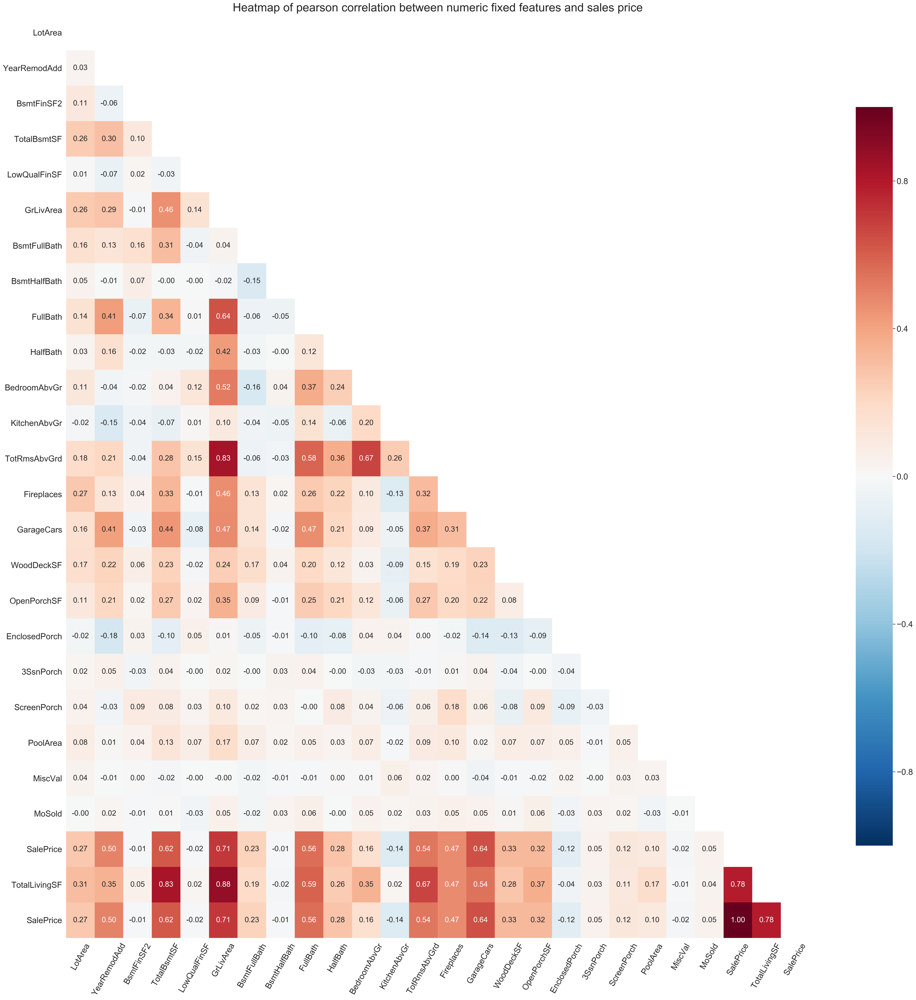

In [47]:
# Call function to generate pearson correlation heatmap for numeric, fixed feature data
# concatenated with SalePrice
correlation_heat_map(pd.concat([house_ff, house_df.SalePrice], axis=1), 'pearson')

Person correlation > +- 0.5 between SalePrice and:

- TotalBsmtSF (+/-062)
- GrLivArea (+/- 0.71)
- FullBath (0.59)
- TotRmsAbvGrd (0.54)
- Fireplaces (0.62)
- TotalLivingSF (0.79)


In [48]:
# Assign list of numerical predictors based on analysis of correlation data above
predictors_num = [ 'YearRemodAdd', 'TotalBsmtSF', 'GrLivArea', 'GarageCars',
               'Fireplaces', 'WoodDeckSF', 'OpenPorchSF' ]

In [49]:
# Display descriptive statistics of selected numerical features
house_ff[predictors_num].describe()

,YearRemodAdd,TotalBsmtSF,GrLivArea,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF
count,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000,1385.000000
mean,1984.121300,1062.618773,1515.031047,1.753791,0.627437,96.589170,43.865704
std,20.554236,443.785047,532.739682,0.755061,0.649454,126.994291,63.585425
min,1950.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000
25%,1966.000000,800.000000,1120.000000,1.000000,0.000000,0.000000,0.000000
50%,1992.000000,994.000000,1459.000000,2.000000,1.000000,0.000000,22.000000
75%,2003.000000,1306.000000,1784.000000,2.000000,1.000000,169.000000,64.000000
max,2010.000000,6110.000000,5642.000000,4.000000,3.000000,857.000000,547.000000


In [50]:
# Define a separate list of categorical predictors, and include neighborhood
predictors_cat = ['Neighborhood', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
                  'Condition1', 'BldgType','HouseStyle', 'OverallQual', 'OverallCond',
                 'BsmtCond', 'BsmtExposure','BsmtFinSF1','GarageFinish', 'OpenPorchSF']

In [51]:
# Print col_indexes to help identify column indexes for categorical fixed features of interest
print(col_indexes)

{0: 'MSSubClass', 1: 'MSZoning', 2: 'LotFrontage', 3: 'LotArea', 4: 'Street', 5: 'LotShape', 6: 'LandContour', 7: 'Utilities', 8: 'LotConfig', 9: 'LandSlope', 10: 'Neighborhood', 11: 'Condition1', 12: 'Condition2', 13: 'BldgType', 14: 'HouseStyle', 15: 'OverallQual', 16: 'OverallCond', 17: 'YearBuilt', 18: 'YearRemodAdd', 19: 'RoofStyle', 20: 'RoofMatl', 21: 'Exterior1st', 22: 'Exterior2nd', 23: 'MasVnrType', 24: 'MasVnrArea', 25: 'ExterQual', 26: 'ExterCond', 27: 'Foundation', 28: 'BsmtQual', 29: 'BsmtCond', 30: 'BsmtExposure', 31: 'BsmtFinType1', 32: 'BsmtFinSF1', 33: 'BsmtFinType2', 34: 'BsmtFinSF2', 35: 'BsmtUnfSF', 36: 'TotalBsmtSF', 37: 'Heating', 38: 'HeatingQC', 39: 'CentralAir', 40: 'Electrical', 41: '1stFlrSF', 42: '2ndFlrSF', 43: 'LowQualFinSF', 44: 'GrLivArea', 45: 'BsmtFullBath', 46: 'BsmtHalfBath', 47: 'FullBath', 48: 'HalfBath', 49: 'BedroomAbvGr', 50: 'KitchenAbvGr', 51: 'KitchenQual', 52: 'TotRmsAbvGrd', 53: 'Functional', 54: 'Fireplaces', 55: 'FireplaceQu', 56: 'Garag

In [52]:
# Identify and define categorical variables of interest to understand their relationship with sales price
ff_cat_col_indexes = [5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 29, 30, 32, 58, 65]
cat_cols_to_eda = [col_indexes[key] for key in ff_cat_col_indexes]

In [53]:
# EDA of these variables
house_df[cat_cols_to_eda].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1385 entries, 0 to 1384
Data columns (total 16 columns):
LotShape        1385 non-null object
LandContour     1385 non-null object
Utilities       1385 non-null object
LotConfig       1385 non-null object
LandSlope       1385 non-null object
Neighborhood    1385 non-null object
Condition1      1385 non-null object
BldgType        1385 non-null object
HouseStyle      1385 non-null object
OverallQual     1385 non-null int64
OverallCond     1385 non-null int64
BsmtCond        1348 non-null object
BsmtExposure    1347 non-null object
BsmtFinSF1      1385 non-null int64
GarageFinish    1306 non-null object
OpenPorchSF     1385 non-null int64
dtypes: int64(4), object(12)
memory usage: 173.2+ KB


A number of selected categorical features contain null values, including: BsmtCond, BsmtExposure,  and GarageFinish.

#### Data: BsmtCond -->  Remove NAN and Change to NA as we assume that with NAN the house does not have a basement.

In [54]:
# Display unique values in BsmtQual field
house_df['BsmtCond'].unique()

array(['TA', 'Gd', nan, 'Fa', 'Po'], dtype=object)

In [55]:
# Fill null BsmtQual values with 'NA'
house_df.loc[house_df['BsmtCond'].isnull(), 'BsmtCond'] = 'NA'

#### Data: BsmtExposure --> Remove NAN and Change to NA as we assume that with NAN the house does not have a basement as per above assumtion as well

In [56]:
# Display unique values in BsmtExposure field
house_df['BsmtExposure'].unique()

array(['No', 'Gd', 'Mn', 'Av', nan], dtype=object)

In [57]:
# Fill null BsmtExposure values with 'NA'
house_df.loc[house_df['BsmtExposure'].isnull(), 'BsmtExposure'] = 'NA'

#### Data: GarageFinish --> Remove NAN and Change to NA as we assume that with NAN the house does not have a Garage with the house

In [58]:
# Display unique values in BsmtExposure field
house_df['GarageFinish'].unique()

array(['RFn', 'Unf', 'Fin', nan], dtype=object)

In [59]:
# Fill null BsmtExposure values with 'NA'
house_df.loc[house_df['GarageFinish'].isnull(), 'GarageFinish'] = 'NA'

In [60]:
# EDA of these variables Review
house_df[cat_cols_to_eda].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1385 entries, 0 to 1384
Data columns (total 16 columns):
LotShape        1385 non-null object
LandContour     1385 non-null object
Utilities       1385 non-null object
LotConfig       1385 non-null object
LandSlope       1385 non-null object
Neighborhood    1385 non-null object
Condition1      1385 non-null object
BldgType        1385 non-null object
HouseStyle      1385 non-null object
OverallQual     1385 non-null int64
OverallCond     1385 non-null int64
BsmtCond        1385 non-null object
BsmtExposure    1385 non-null object
BsmtFinSF1      1385 non-null int64
GarageFinish    1385 non-null object
OpenPorchSF     1385 non-null int64
dtypes: int64(4), object(12)
memory usage: 173.2+ KB


In [61]:
# Define a function to create box and swarmplots of the Sale Price for each value of a categorical feature
# and include the feature's value_counts in the x-axis label

def plot_price_boxplot(cat_var, df, y_var='SalePrice'):
    ''' This function accepts a dataframe, cat_var string and option y_var string, and plots a box plot and 
    swarmplot of y_var for each value of cat_var in the df.  The counts of each value in the cat_var 
    column are included in the x-axis. '''
    
    fig, ax = plt.subplots(figsize=(9,4))

    y_axis = y_var
    x_axis = cat_var
    
    # Plot box and swarm plot
    ax = sns.boxplot(x=x_axis, y=y_axis, data=df, linewidth=0.7, color='black', fliersize=0)
    ax = sns.swarmplot(x=x_axis, y=y_axis, data=df, palette='Set2', size=2)
    
    plt.setp(ax.lines, color='red')
     
    # Restrict range of y-axis to enable a clear view of the plots
    if y_var == 'SalePrice':
        ax.set_ylim(0,500000)     
        y_ticks = list(range(0,600000,100000))
    elif y_var == 'Residuals':
        ax.set_ylim(-200000,200000)    
        y_ticks = list(range(-200000,200000,50000)) 
        
    ax.set_title(f'{y_var} vs. {cat_var}')
    ax.set_ylabel(f'{y_var} ($)')
    ax.set_yticklabels(y_ticks)
    
    plt.xticks()
    ax.set_xlabel(pd.DataFrame(df[cat_var].value_counts()))
    ax.set_xticklabels(ax.xaxis.get_ticklabels())
    
    # Add light grey horizontal grid lines to plot
    ax.yaxis.grid(True, linestyle='-', which='both', color='lightgrey', alpha=0.5) 
    plt.show()

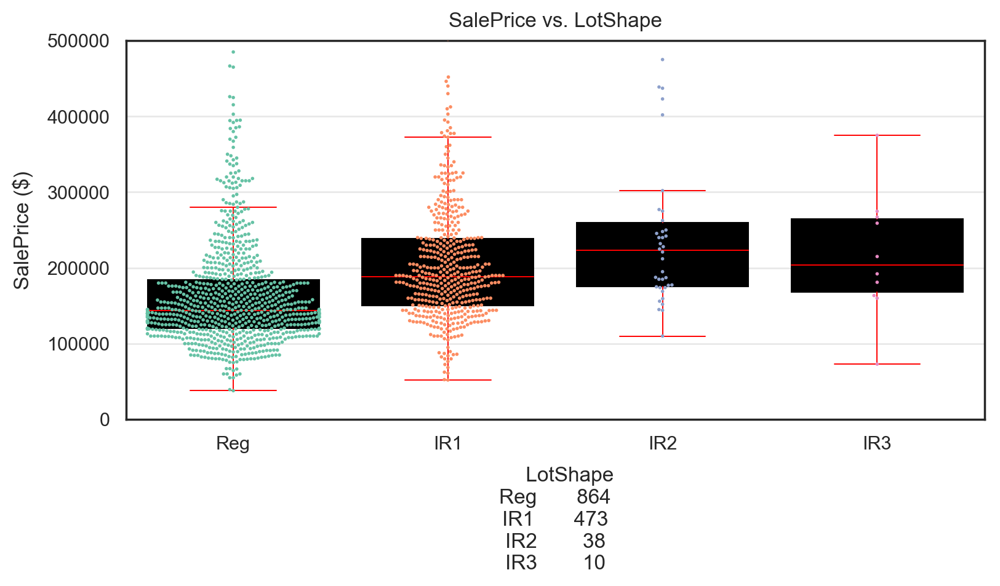

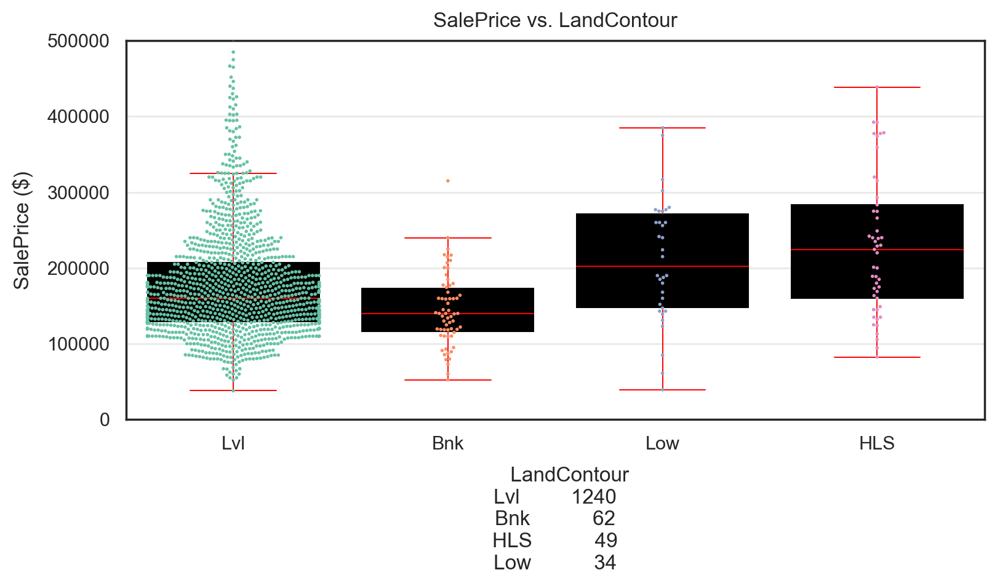

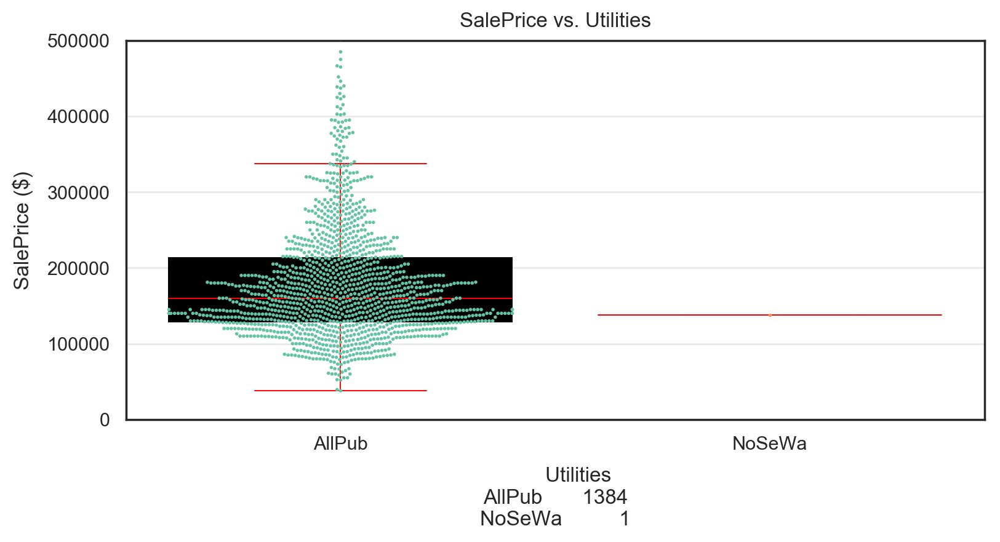

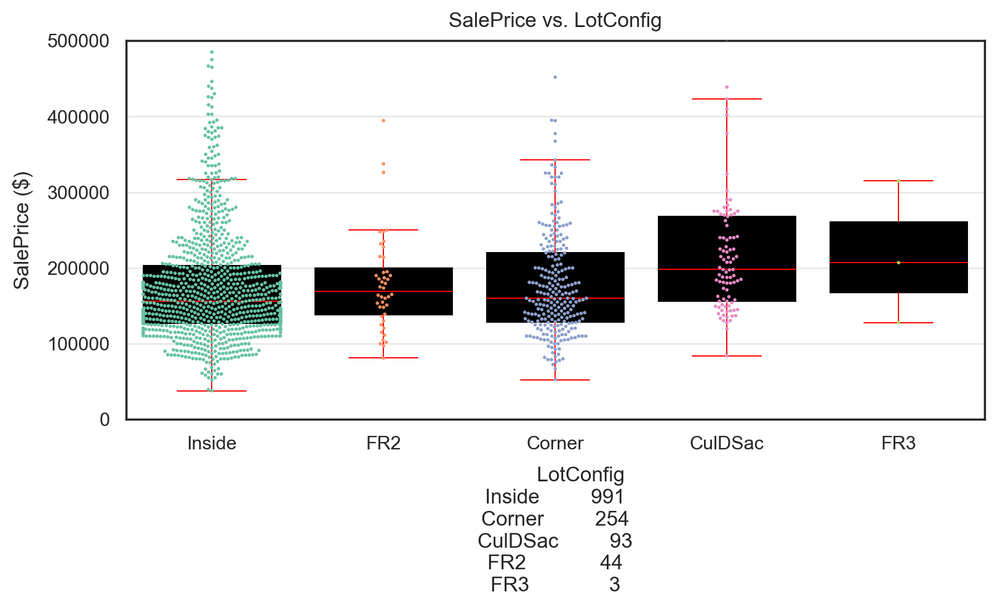

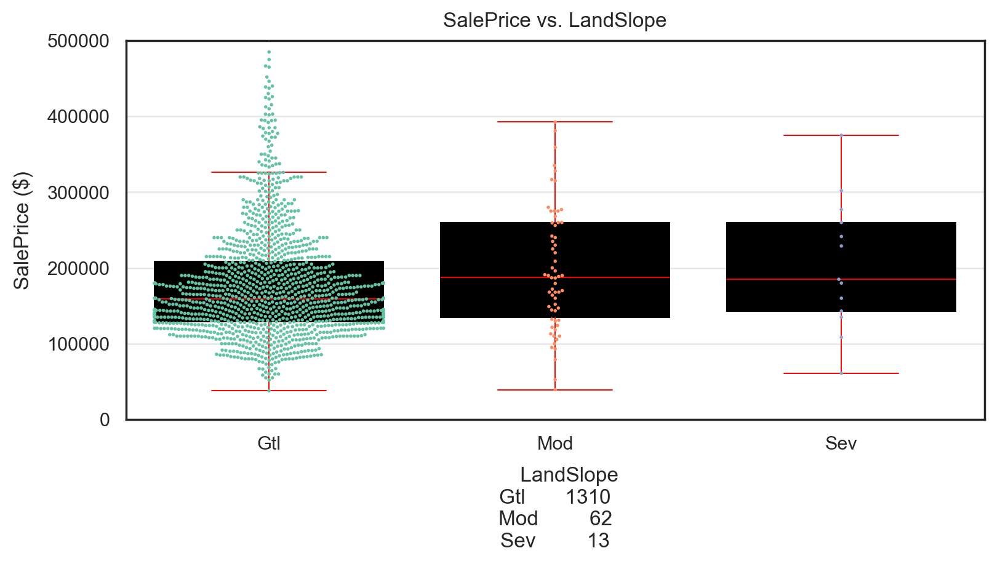

...

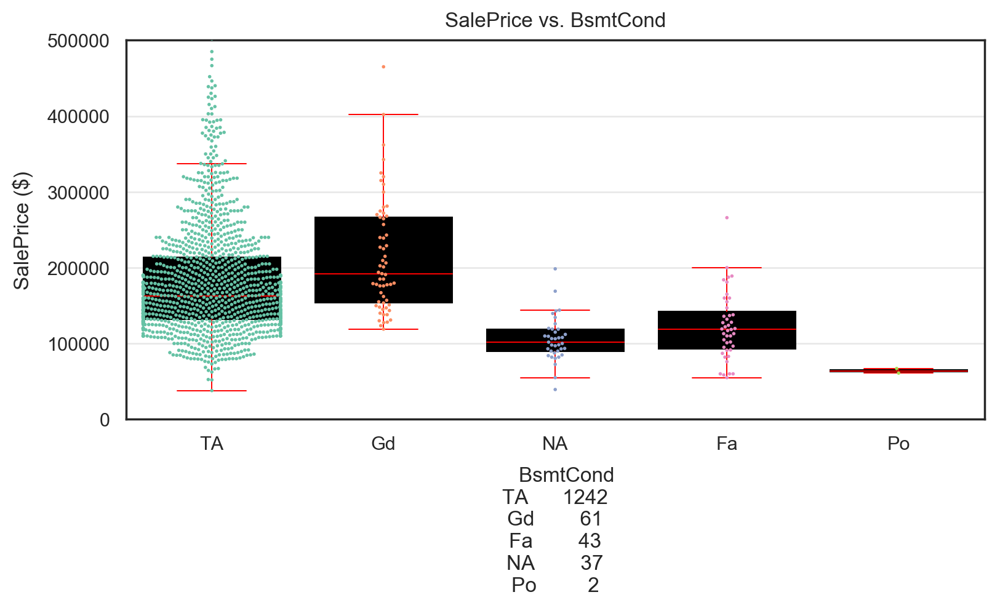

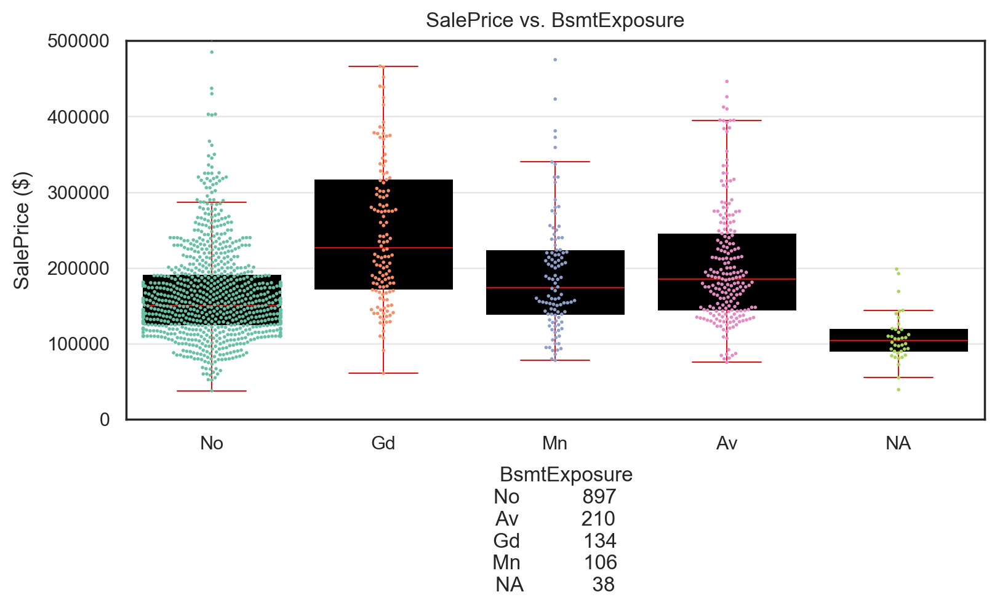

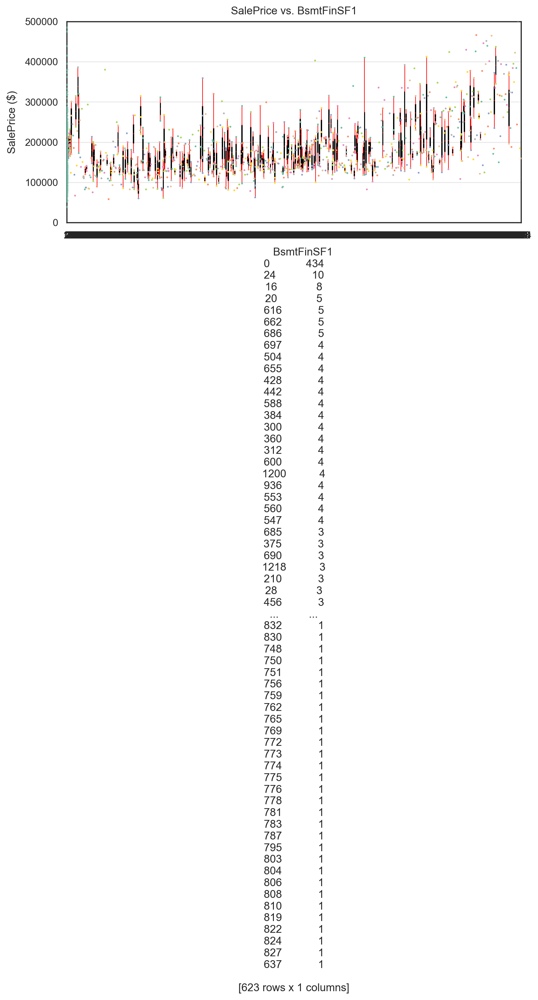

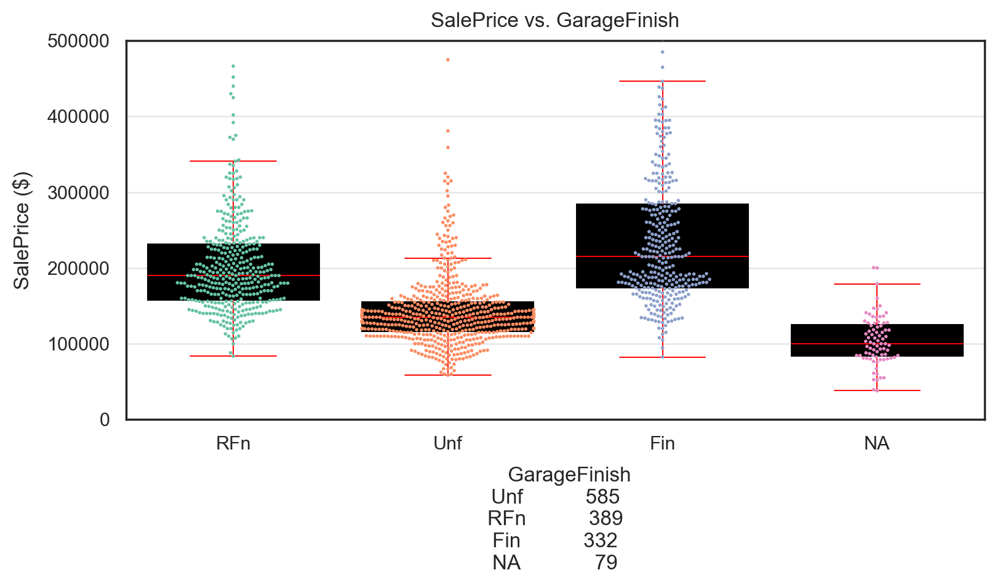

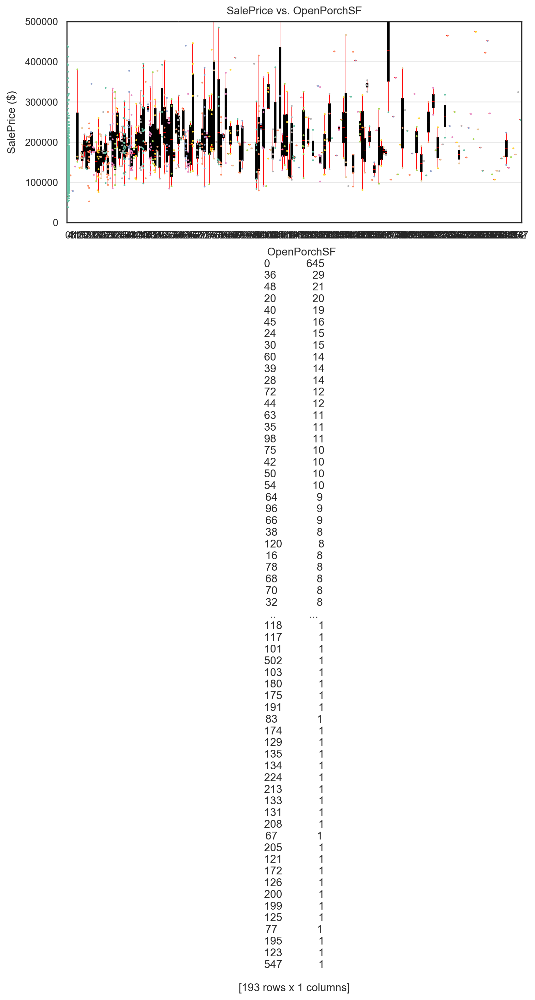

In [62]:
# Call plot_price_boxplot function for each categorical variable in the cat_cols_to_eda list
for cat_var in cat_cols_to_eda:
    plot_price_boxplot(cat_var, house_df)

### Train and evaluate a model to predict sales price

#### Define predictor and target

Combine the Categorial and Numerical Predictor to one.

In [63]:
# Print numeric and categorical variables
print(f'Proposed numeric predictors: \n{predictors_num}\n')   
print(f'Proposed categorical predictors: \n{predictors_cat}\n')   

# Define list of all proposed predictors and print list
predictors_all = predictors_num + predictors_cat
print(f'All proposed predictors: \n{predictors_all}\n')

Proposed numeric predictors: 
['YearRemodAdd', 'TotalBsmtSF', 'GrLivArea', 'GarageCars', 'Fireplaces', 'WoodDeckSF', 'OpenPorchSF']

Proposed categorical predictors: 
['Neighborhood', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Condition1', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'BsmtCond', 'BsmtExposure', 'BsmtFinSF1', 'GarageFinish', 'OpenPorchSF']

All proposed predictors: 
['YearRemodAdd', 'TotalBsmtSF', 'GrLivArea', 'GarageCars', 'Fireplaces', 'WoodDeckSF', 'OpenPorchSF', 'Neighborhood', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Condition1', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'BsmtCond', 'BsmtExposure', 'BsmtFinSF1', 'GarageFinish', 'OpenPorchSF']



#### Model is to be trained on pre-2010 data and tested on 2010 data.

In [64]:
 # Print number of rows expected in train-test split
print(f"We expect {(house_df['YrSold'] < 2010).sum()} homes in the training set.")
print(f"We expect {(house_df['YrSold'] == 2010).sum()} homes in the testing set.")

We expect 1221 homes in the training set.
We expect 164 homes in the testing set.


In [65]:
# Define predictor DF and target series
X = house_df[predictors_all]
y = house_df['SalePrice']

In [66]:
# Display predictor information
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1385 entries, 0 to 1384
Data columns (total 23 columns):
YearRemodAdd    1385 non-null int64
TotalBsmtSF     1385 non-null int64
GrLivArea       1385 non-null int64
GarageCars      1385 non-null int64
Fireplaces      1385 non-null int64
WoodDeckSF      1385 non-null int64
OpenPorchSF     1385 non-null int64
Neighborhood    1385 non-null object
LotShape        1385 non-null object
LandContour     1385 non-null object
Utilities       1385 non-null object
LotConfig       1385 non-null object
LandSlope       1385 non-null object
Condition1      1385 non-null object
BldgType        1385 non-null object
HouseStyle      1385 non-null object
OverallQual     1385 non-null int64
OverallCond     1385 non-null int64
BsmtCond        1385 non-null object
BsmtExposure    1385 non-null object
BsmtFinSF1      1385 non-null int64
GarageFinish    1385 non-null object
OpenPorchSF     1385 non-null int64
dtypes: int64(11), object(12)
memory usage: 248.9+ KB

In [67]:
# Dumify categorical variables in predictor data, dropping the first value for each field
X_dumified = pd.get_dummies(X, drop_first=True)

# Display head of X_dumified df
X_dumified.head()

,YearRemodAdd,TotalBsmtSF,GrLivArea,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,OverallQual,OverallCond,BsmtFinSF1,...,BsmtCond_NA,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
0,2003,856,1710,2,0,0,61,7,5,706,...,0,0,1,0,0,0,1,0,1,0
1,1976,1262,1262,2,1,298,0,6,8,978,...,0,0,1,1,0,0,0,0,1,0
2,2002,920,1786,2,1,0,42,7,5,486,...,0,0,1,0,1,0,0,0,1,0
3,1970,756,1717,3,1,0,35,7,5,216,...,0,0,0,0,0,0,1,0,0,1
4,2000,1145,2198,3,1,192,84,8,5,655,...,0,0,1,0,0,0,0,0,1,0


In [68]:
# Define train and test data sets
X_train = X_dumified[house_df['YrSold'] < 2010]  
X_test = X_dumified[house_df['YrSold'] == 2010]

y_train = y[house_df['YrSold'] < 2010]
y_test = y[house_df['YrSold'] == 2010]

In [69]:
# Print type and shape of feature and target train and test data to ensure aligned with expectations
print(type(X_train), type(X_test), type(y_train), type(y_test))
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

<class 'pandas.core.frame.DataFrame'> <class 'pandas.core.frame.DataFrame'> <class 'pandas.core.series.Series'> <class 'pandas.core.series.Series'>
(1221, 78) (164, 78) (1221,) (164,)


In [70]:
# Standardise train and test predictor data, based on mean and std of training data only

ss = StandardScaler()

X_train_ss = ss.fit_transform(X_train)
X_test_ss = ss.transform(X_test)

Review standardised train and test predictor data

In [71]:
# Display summary statistics for standardised predictor training data
pd.DataFrame(X_train_ss, columns=X_dumified.columns).describe()

,YearRemodAdd,TotalBsmtSF,GrLivArea,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,OverallQual,OverallCond,BsmtFinSF1,...,BsmtCond_NA,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
count,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03,...,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03,1.221000e+03
mean,-1.455020e-15,-4.264493e-17,1.260253e-16,3.473425e-17,1.443017e-16,-1.091128e-16,-4.491811e-17,1.657606e-16,1.665335e-16,-3.437054e-17,...,-1.729893e-16,-2.290915e-16,8.010700e-17,-3.170637e-16,-2.790561e-16,2.959685e-17,-1.582136e-17,-1.774902e-16,-3.778032e-16,-1.260253e-16
std,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,...,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00
min,-1.654405e+00,-2.375650e+00,-2.214289e+00,-2.326473e+00,-9.792191e-01,-7.608876e-01,-6.914867e-01,-3.678029e+00,-4.107325e+00,-9.719537e-01,...,-1.640530e-01,-4.050542e-02,-2.872281e+00,-3.346967e-01,-2.888032e-01,-1.666667e-01,-1.349022e+00,-2.428509e-01,-6.237616e-01,-8.583951e-01
25%,-8.769851e-01,-5.895294e-01,-7.347857e-01,-1.007706e+00,-9.792191e-01,-7.608876e-01,-6.914867e-01,-7.788209e-01,-5.353564e-01,-9.719537e-01,...,-1.640530e-01,-4.050542e-02,3.481553e-01,-3.346967e-01,-2.888032e-01,-1.666667e-01,-1.349022e+00,-2.428509e-01,-6.237616e-01,-8.583951e-01
50%,3.863223e-01,-1.625595e-01,-9.964518e-02,3.110605e-01,5.735426e-01,-7.608876e-01,-3.241645e-01,-5.401883e-02,-5.353564e-01,-1.389667e-01,...,-1.640530e-01,-4.050542e-02,3.481553e-01,-3.346967e-01,-2.888032e-01,-1.666667e-01,7.412775e-01,-2.428509e-01,-6.237616e-01,-8.583951e-01
75%,9.207985e-01,5.527828e-01,4.943980e-01,3.110605e-01,5.735426e-01,5.829674e-01,3.186492e-01,6.707832e-01,3.576356e-01,5.836765e-01,...,-1.640530e-01,-4.050542e-02,3.481553e-01,-3.346967e-01,-2.888032e-01,-1.666667e-01,7.412775e-01,-2.428509e-01,1.603177e+00,1.164965e+00
max,1.212331e+00,1.128292e+01,7.701375e+00,2.948594e+00,3.679066e+00,6.094373e+00,7.680397e+00,2.845189e+00,3.036612e+00,1.123942e+01,...,6.095593e+00,2.468805e+01,3.481553e-01,2.987780e+00,3.462566e+00,6.000000e+00,7.412775e-01,4.117752e+00,1.603177e+00,1.164965e+00


In [72]:
# Display summary statistics for standardised predictor test data
pd.DataFrame(X_test_ss, columns=X_dumified.columns).describe()

,YearRemodAdd,TotalBsmtSF,GrLivArea,GarageCars,Fireplaces,WoodDeckSF,OpenPorchSF,OverallQual,OverallCond,BsmtFinSF1,...,BsmtCond_NA,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_NA,BsmtExposure_No,GarageFinish_NA,GarageFinish_RFn,GarageFinish_Unf
count,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,...,164.000000,1.640000e+02,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000,164.000000
mean,0.029610,-0.001894,-0.068002,-0.115126,-0.041881,0.099166,-0.169900,-0.067277,0.063602,0.026259,...,0.026790,-4.050542e-02,0.132150,-0.111848,-0.014313,0.021341,0.040262,0.049629,0.014446,-0.031779
std,0.988553,0.930400,0.956248,0.957194,1.068873,1.123601,0.724615,0.958310,1.042665,0.943903,...,1.079487,8.352176e-17,0.808055,0.833659,0.979911,1.063453,0.989891,1.094140,1.010030,0.997656
min,-1.654405,-2.375650,-1.661344,-2.326473,-0.979219,-0.760888,-0.691487,-2.228425,-3.214333,-0.971954,...,-0.164053,-4.050542e-02,-2.872281,-0.334697,-0.288803,-0.166667,-1.349022,-0.242851,-0.623762,-0.858395
25%,-0.840544,-0.574999,-0.824453,-1.007706,-0.979219,-0.760888,-0.691487,-0.778821,-0.535356,-0.971954,...,-0.164053,-4.050542e-02,0.348155,-0.334697,-0.288803,-0.166667,-1.349022,-0.242851,-0.623762,-0.858395
50%,0.386322,-0.072024,-0.237882,0.311060,-0.979219,-0.760888,-0.691487,-0.054019,-0.535356,-0.080549,...,-0.164053,-4.050542e-02,0.348155,-0.334697,-0.288803,-0.166667,0.741278,-0.242851,-0.623762,-0.858395
75%,0.920799,0.458894,0.479921,0.311060,0.573543,0.774947,0.169425,0.670783,1.250628,0.578808,...,-0.164053,-4.050542e-02,0.348155,-0.334697,-0.288803,-0.166667,0.741278,-0.242851,1.603177,1.164965
max,1.260920,2.832936,3.287148,1.629827,2.126304,4.582536,3.318447,2.120387,3.036612,3.762009,...,6.095593,-4.050542e-02,0.348155,2.987780,3.462566,6.000000,0.741278,4.117752,1.603177,1.164965


In [73]:
# Display summary statistics of target training data
y_train.describe()

count      1221.000000
mean     180447.279279
std       79760.164196
min       37900.000000
25%      129500.000000
50%      161000.000000
75%      213000.000000
max      755000.000000
Name: SalePrice, dtype: float64

In [74]:
# Display summary statistics of target test data
y_test.describe()

count       164.000000
mean     177820.878049
std       81196.031764
min       55000.000000
25%      128150.000000
50%      154650.000000
75%      210500.000000
max      611657.000000
Name: SalePrice, dtype: float64

Not sure where it has gone wrong, the Mean price not as expected.  
I've removed my previous Analysis as it was calculating the wrong mean on my Test stats.  Now is looks reasonably good as per expected mean.

### Train and evaluate Linear Regression Model

Start by fitting a linear regression on training data (pre-2010 sales) without any cross-validation or regularization, and evaluate R2 score on both train and test data

In [75]:
# Fit Linear Regression model on training data and evaluate on test data
lnr = LinearRegression()
lnr.fit(X_train_ss, y_train)
print(f'R2 score on training data: {round(lnr.score(X_train_ss, y_train),3)}')
print(f'R2 score on test data: {round(lnr.score(X_test_ss, y_test),3)}')

R2 score on training data: 0.856
R2 score on test data: 0.867


The model has an R2 of 0.86 on the test data, which means that the predictor variables I've chosen explain 86% of the variance in the target test data not explained by the baseline prediction (i.e. mean of the Sale Price).

The model is doing a good job of predicting the sales price and has generalised well to the test data. So far so good.

In [76]:
# Print baseline prediction
print(f'Baseline prediction: ${round(np.mean(y_test))}')

Baseline prediction: $177821


In [77]:
# Look at model intercept and range of coefficients
print(f'Intercept: {lnr.intercept_}')
print(f'\nRange of Coefficients: {[min(lnr.coef_), max(lnr.coef_)]}')

Intercept: 180447.2792792793

Range of Coefficients: [-1.4087759560495862e+16, 1.4087759560497388e+16]


With standardised predictors, the intercept can be interpreted as the estimate when all predictors are at their mean value.

Coefficients are units of standard deviations of the predictors.

Standardising the predictors also allows for direct comparison (and regularisation) of the magnitude of impact between different predictors.

### Model evaluation with root mean squared error

In [78]:
# Calculate RMSE
predictions = lnr.predict(X_test_ss)

print(f'Root Mean Square Error of model on test data is: \
${int(mean_squared_error(y_test, predictions)**0.5)}')

print(f'Root Mean Square Error of model on train data is: \
${int(mean_squared_error(y_train, lnr.predict(X_train_ss))**0.5)}')

Root Mean Square Error of model on test data is: $29482
Root Mean Square Error of model on train data is: $30223


The RMSE is quite good, and similar for the training and test data

In [79]:
# Print RMSE for baseline prediction, for comparion
baseline = np.repeat(np.mean(y_test), len(y_test))

print(f'Root Mean Square Error of baseline model is: \
${int(mean_squared_error(y_test, baseline)**0.5)}.')

Root Mean Square Error of baseline model is: $80948.


As indicated by the R2 score, the model has a significantly lower RMSE than the baseline prediction.

In [80]:
# Define a function to plot predictions vs actuals

def plot_y_yhat(y, yhat):
    '''This function accepts 2 series and plots a scatter plot of y vs yhat.
    The function also plots an x=y line to demonstrate the 'perfect model', 
    where y = yhat'''

    plt.figure(figsize=(5,5))

    plt.scatter(y, yhat, color='mediumorchid', s=4, label='Predicted vs. Actual', alpha=0.7 )

    # Plot 'perfect model' (x=y) line on plot
    max_val = np.max(y)
    plt.plot([0, max_val*1.05], [0, max_val*1.05], color='navy',
            linewidth=2.0, alpha=0.5, label='Perfect model', )
    
    # Add grid to plot
    plt.grid(color='lightgrey', linewidth=0.7, linestyle='--')
    
    plt.xlabel('Actual Sale Price ($)')
    plt.xlim(0,max_val*1.05)

    plt.ylabel('Predicted Sale Price ($)')
    plt.ylim(0,max_val*1.05)
    
    plt.title('Plot of predicted values vs. actual values')
    plt.legend() 
    plt.show()

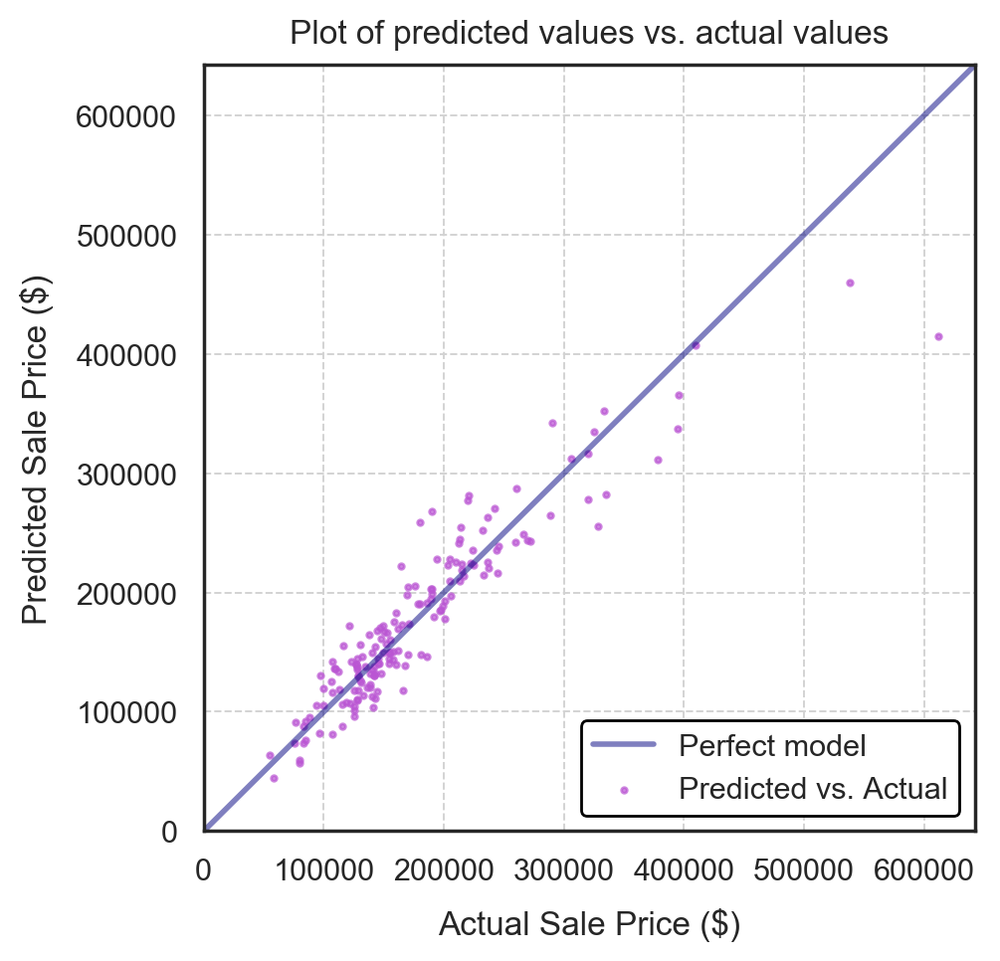

In [81]:
# Call function to plot model predictions vs actual test values
plot_y_yhat(y_test, lnr.predict(X_test_ss))

Model performs well. There are a couple of sales with high values that aren't represented well by the model and have large residuals.  However percentage wise it looks like the models fits quite good.

In [82]:
# Display descriptive statistics for model predictions
pd.DataFrame(lnr.predict(X_test_ss), columns=['Predicted Sales Price']).describe()

,Predicted Sales Price
count,164.000000
mean,177010.889133
std,73801.294119
min,44863.073613
25%,128633.620470
50%,155776.102281
75%,222325.457143
max,460011.010089


In [83]:
# Display 10 largest model residuals, where prediction underestimated actual sale price 
df = pd.DataFrame({'Actual':y_test,'Prediction':lnr.predict(X_test_ss)})
df['Residual'] = df['Actual'] - df['Prediction']
df.sort_values('Residual', inplace=True, ascending=False)
df.head(10)

,Actual,Prediction,Residual
847,611657,414605.979474,197051.020526
725,538000,460011.010089,77988.989911
1006,328000,255685.019251,72314.980749
1200,378500,311029.213910,67470.786090
359,394432,336963.435285,57468.564715
1242,335000,281927.175583,53072.824417
134,166000,118115.771362,47884.228638
44,319900,277797.639946,42102.360054
201,186000,146618.013446,39381.986554
263,141000,103769.407747,37230.592253


In [84]:
# Display 10 largest negative residuals, where prediction overestimated actual sale price 
df.tail(10)

,Actual,Prediction,Residual
1177,170000,204989.960017,-34989.960017
906,116500,155233.909922,-38733.909922
536,214000,254547.872159,-40547.872159
529,121500,172139.605043,-50639.605043
258,290000,342474.611061,-52474.611061
153,220000,277479.165811,-57479.165811
1147,164000,222057.080158,-58057.080158
647,221000,281242.069394,-60242.069394
1253,190000,268077.535893,-78077.535893
63,180000,258889.618776,-78889.618776


### Cross validation and Regularisation grid search

### Ridge

In [85]:
# Gridsearch using RidgeCV.  Fit model and print R2 score for test data.
ridge_alphas = np.logspace(-3,5,200)
ridge = RidgeCV(alphas=ridge_alphas, cv=5)
ridge.fit(X_train_ss, y_train)

print(f'Optimal Ridge R2 score on training data: {round(ridge.score(X_train_ss, y_train),3)}')
print(f'Best alpha: {round(ridge.alpha_,3)}')

Optimal Ridge R2 score on training data: 0.851
Best alpha: 139.871


There has been no improvement in the model on the training data with the GridSearch on Ridge regularisation hyperparamaters.

In [86]:
# Using the best alpha, cross validate the training data and print the mean R2 score
optimum_ridge = Ridge(alpha = ridge.alpha_)
print(f'Mean R2 score for optimal Ridge cross validation on training data:', 
      round(np.mean(cross_val_score(optimum_ridge, X_train_ss, y_train, cv=5)),3))

Mean R2 score for optimal Ridge cross validation on training data: 0.817


In [87]:
# Fit optimum ridge on training data, and score it on the test data
optimum_ridge.fit(X_train_ss, y_train)
print(f'R2 score of optimum Ridge on test data: {round(optimum_ridge.score(X_test_ss,y_test),3)}')

R2 score of optimum Ridge on test data: 0.862


Ridge regularisation has yielded no improvement on the model performance.

### Lasso

In [88]:
# Perform a lasso regularisation gridserach
lasso = LassoCV(alphas=np.logspace(-4,3,500), cv=10, verbose=1, max_iter=10000)
lasso.fit(X_train_ss, y_train)

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

LassoCV(alphas=array([1.00000e-04, 1.03283e-04, ..., 9.68215e+02, 1.00000e+03]),
    copy_X=True, cv=10, eps=0.001, fit_intercept=True, max_iter=10000,
    n_alphas=100, n_jobs=1, normalize=False, positive=False,
    precompute='auto', random_state=None, selection='cyclic', tol=0.0001,
    verbose=1)

In [89]:
# Display optimum alpha value
lasso.alpha_

823.8187331399602

Not sure if this is within range or reasonable value

In [90]:
# Score optimum lasso model on test data
print(f'R2 score for optimum Lasso model on test data: {round(lasso.score(X_test_ss, y_test),3)}')

R2 score for optimum Lasso model on test data: 0.858


The optimum Lasso model performs very similar to the Ridge regularisation, so there's not much difference here

Review the coefficients for the optimum Lasso model

In [91]:
# Define dataframe with predictor coefficients for optimum Lasso model
lasso_coeffs = pd.DataFrame({'Feature': X_dumified.columns,
                             'Coef': lasso.coef_,
                             'Abs_Coef': np.abs(lasso.coef_)})

lasso_coeffs.sort_values('Abs_Coef', inplace=True, ascending=False)

In [92]:
# Display 10 most important/largest coefficients
lasso_coeffs.head(10)

,Feature,Coef,Abs_Coef
2,GrLivArea,25369.802565,25369.802565
7,OverallQual,20878.757169,20878.757169
26,Neighborhood_NridgHt,13337.885586,13337.885586
3,GarageCars,9810.831287,9810.831287
25,Neighborhood_NoRidge,9294.559561,9294.559561
32,Neighborhood_StoneBr,6895.801725,6895.801725
71,BsmtExposure_Gd,5642.993573,5642.993573
9,BsmtFinSF1,5149.984191,5149.984191
59,BldgType_TwnhsE,-4925.021549,4925.021549
0,YearRemodAdd,4776.337136,4776.337136


The 2 numerical predictors with the highest correlation with sales price (HouseStyle_1Story and BsmtExposure_Gd) also turn out to be the 2 most significant numeric predictors from a coefficient perceptive.  From a buying perspective, have not considered this aspect as on the inital correlation analysis TotalLivingSF was very highly corelated

In [93]:
# Display 10 least important/smallest coefficients
lasso_coeffs.tail(10)

,Feature,Coef,Abs_Coef
54,Condition1_RRNe,0.0,0.0
53,Condition1_RRAn,0.0,0.0
52,Condition1_RRAe,-0.0,0.0
51,Condition1_PosN,-0.0,0.0
50,Condition1_PosA,0.0,0.0
30,Neighborhood_SawyerW,0.0,0.0
11,Neighborhood_Blueste,-0.0,0.0
47,LandSlope_Sev,0.0,0.0
37,LotShape_Reg,-0.0,0.0
39,LandContour_Low,0.0,0.0


As expected, the Lasso has zeroed out some predictor coefficients.

In [94]:
print(f'Percent of predictor coefficients zeroed out by Lasso regularisation: \
{round((np.sum(lasso.coef_ == 0)/float(X_dumified.shape[1])) * 100,2)}%.')

Percent of predictor coefficients zeroed out by Lasso regularisation: 39.74%.


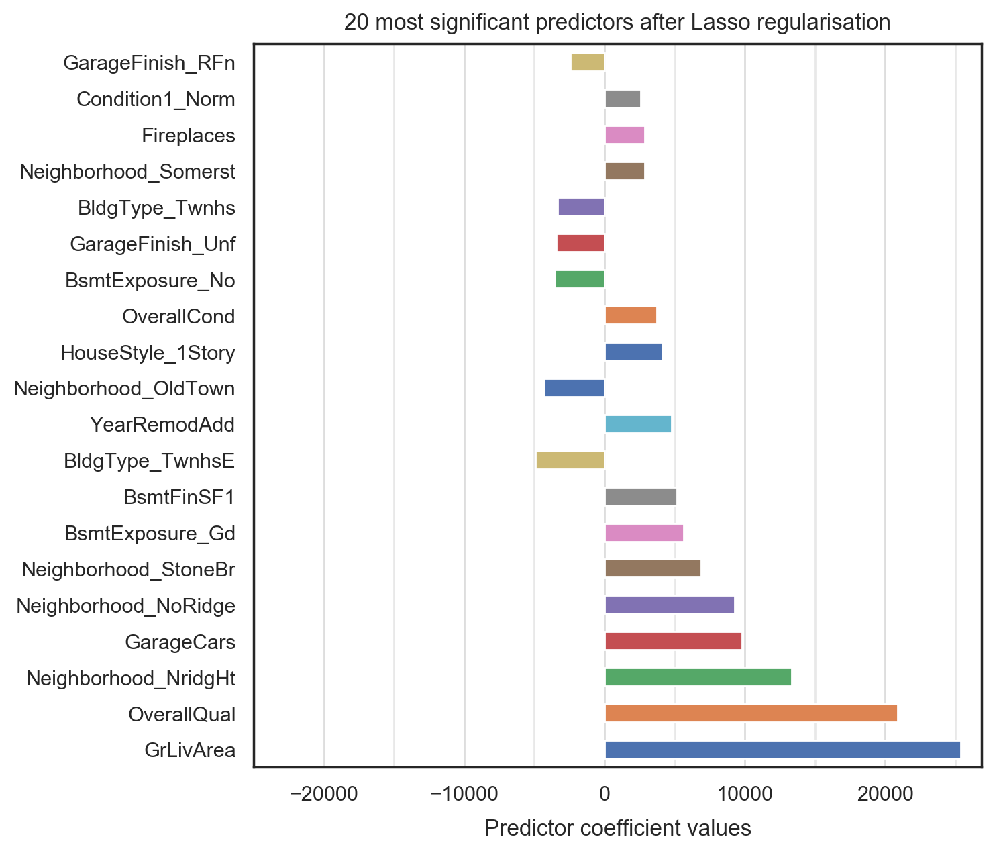

In [95]:
# Plot 20 largest coefficients
fig, ax = plt.subplots(figsize=(7,7))
title = '20 most significant predictors after Lasso regularisation'
lasso_coeffs.Coef[:20].plot(kind='barh', ax=ax)
ax.set_yticklabels(lasso_coeffs.Feature[:20].values)
ax.set_xlabel('Predictor coefficient values')
ax.set_title(title)

# Add a vertical grid to the plot
ax.xaxis.grid(True, linestyle='-', which='both', color='lightgrey', alpha=0.5)
ax.set_xticks(range(-25000, 30000, 5000), minor=True)
plt.show()

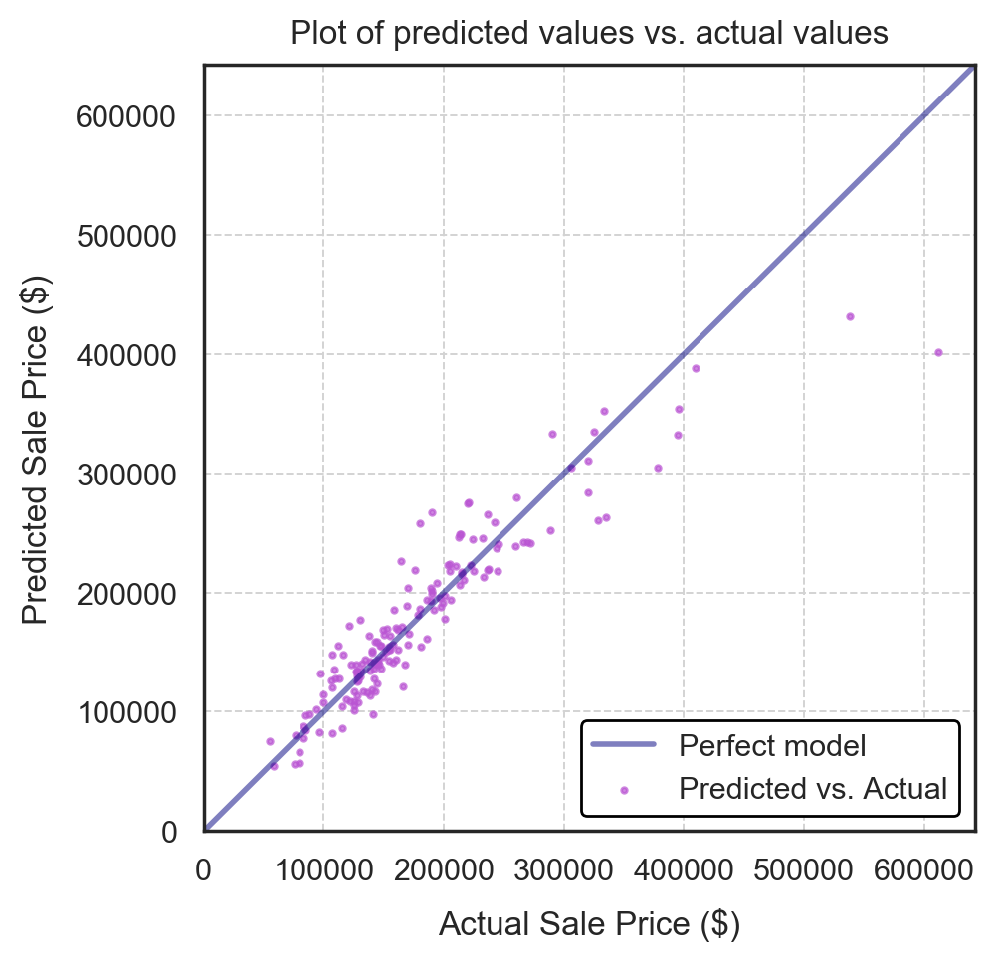

In [96]:
# Plot predictions for test data from optimum lasso model vs actual sale prices
predictions = lasso.predict(X_test_ss)
plot_y_yhat(y_test, predictions)

The model performs well on the test set, apart from 2 data points at the upper extreme of the actual sales price range, and a property around the $180K value.

The standard Linear Regression model performs just as well as the Lasso and Ridge models. Since the Lasso model reduces dimensions there was no significant improvement to the model. For this data sets the Linear regression works well and cannot be improved with other methods, however it's just good to check if performance can be improved with some tweaks.

Should Table a summary of the Results to show the final outcomes


<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 2. Determine any value of *changeable* property characteristics unexplained by the *fixed* ones.

---

Now that you have a model that estimates the price of a house based on its static characteristics, we can move forward with part 2 and 3 of the plan: what are the costs/benefits of quality, condition, and renovations?

There are two specific requirements for these estimates:
1. The estimates of effects must be in terms of dollars added or subtracted from the house value. 
2. The effects must be on the variance in price remaining from the first model.

The residuals from the first model (training and testing) represent the variance in price unexplained by the fixed characteristics. Of that variance in price remaining, how much of it can be explained by the easy-to-change aspects of the property?

---

**Your goals:**
1. Evaluate the effect in dollars of the renovate-able features. 
- How would your company use this second model and its coefficients to determine whether they should buy a property or not? Explain how the company can use the two models you have built to determine if they can make money. 
- Investigate how much of the variance in price remaining is explained by these features.
- Do you trust your model? Should it be used to evaluate which properties to buy and fix up?

### EDA

#### Review residuals for train and test data

In [97]:
# Calculate residuals on train and test data using optimum lasso model
test_residuals = y_test - predictions
train_residuals = y_train - lasso.predict(X_train_ss)

Examine the mean of the residuals for the train and test data. Expect the mean of the residuals for the train data to be 0, as the model has been trained on this data.


In [98]:
# Print mean of residuals for train and test data, rounded to 5 decimal places
print(f'Mean of residuals for train data is: ${round(train_residuals.mean(),5)}')
print(f'Mean of residuals for test data is: ${round(test_residuals.mean(),5)}')

Mean of residuals for train data is: $-0.0
Mean of residuals for test data is: $1147.73014


In [99]:
# Define function to plot histogram of residuals

def plot_residuals_hist(residuals, data_set): 
    '''This function accepts an array of residuals and a data_set string, and plots a 
    histogram of the residuals.  The data_set string is referred to in the plot title.'''

    fig,ax = plt.subplots(figsize=(7,4))
    ax = sns.distplot(residuals, kde=False, bins=40, color='darkorange', rug=True)

    ax.set_title(f'Distribution Plot of actual - modeled sales price residuals for {data_set} data')
    ax.set_xlabel('Residual ($)')
    ax.set_ylabel('Count') 
    ax.grid(color='lightgrey')
    plt.show();

#### Test Data

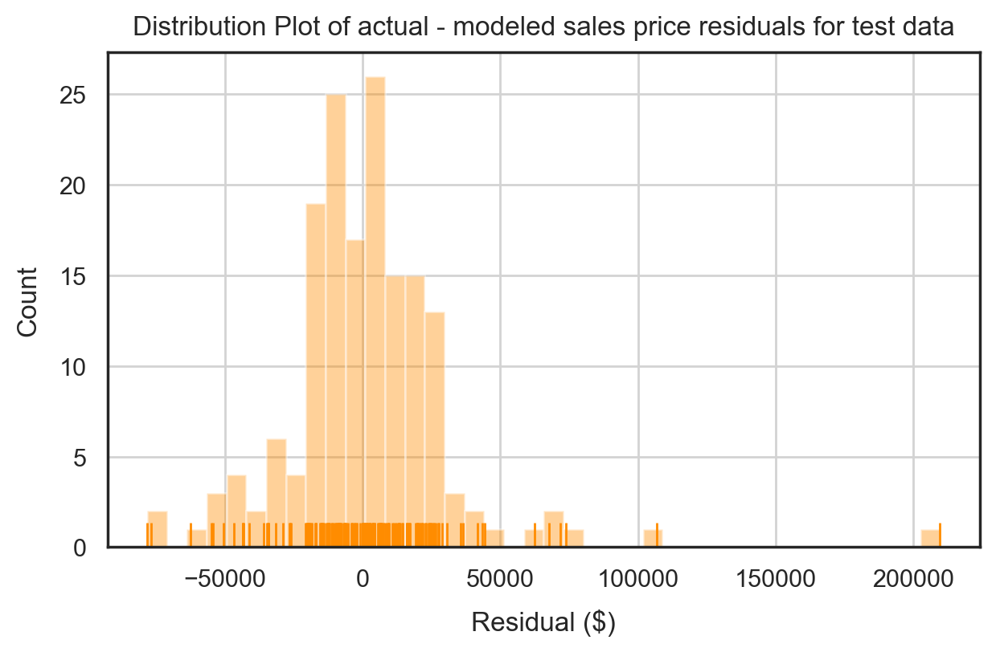

In [100]:
# Call function to plot residuals for test data
plot_residuals_hist(test_residuals, 'test')

The distribution of residuals is approximately normal - centered around 0 - with one large outlier corresponding to the high value property identified in the 'predicted vs actuals' plot above.

### Train Data

In [101]:
# Call function to plot residuals for train data
##plot_residuals_hist(train_residuals, 'train')

There are a number of large outliers in the residuals for the training data, with one very large one exceeding \$300,000. To enforce a more normal distribution for the modeling of these residuals, I'm going to truncate the absolute value of the residuals at \$200,000.


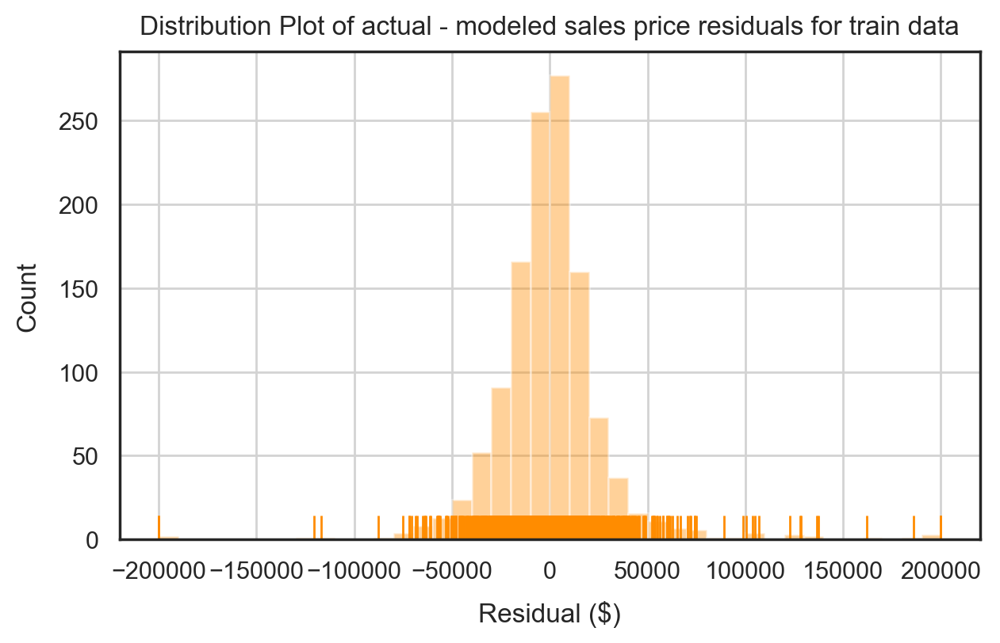

In [102]:
# Truncate residuals at +/- 200,000
train_residuals[train_residuals < -200000] = -200000
train_residuals[train_residuals > 200000] = 200000

# Call function to plot residuals for truncated train data
plot_residuals_hist(train_residuals, 'train')

### Subset data on changeable features

#### Remove fixed features from the predictor matrix, to limit the features to those that are changeable.

In [104]:
# Concatenate index lists of numeric and categorical fixed features for removal from features
all_ff_col_indexes = ff_col_index + ff_cat_col_indexes

In [105]:
print(all_ff_col_indexes)

[3, 4, 18, 19, 20, 26, 34, 36, 37, 38, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 54, 56, 59, 61, 62, 64, 65, 66, 67, 68, 69, 70, 71, 75, 76, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 29, 30, 32, 58, 65]


In [107]:
# Remove YrSold from list, as this will be required for the train-test split YrSold already been removed previously
#all_ff_col_indexes.remove(72)    

# Define list of column names previously considered as fixed features (from the all_ff_col_indexes list)
all_ff_col_names = [col_indexes[key] for key in all_ff_col_indexes]

In [108]:
# Remove fixed feature columns from house_reno df as these won't be considered in the model of residuals
# Print shape of house_reno_df before and after dropping these features
house_reno_df = house_df.copy()
print(house_reno_df.shape)
house_reno_df.drop(columns=all_ff_col_names, axis=1, inplace=True)
print(house_reno_df.shape)

(1385, 77)
(1385, 27)


In [109]:
# Review remaining features in house_reno.df
house_reno_df.head()

,MSSubClass,MSZoning,LotFrontage,Condition2,YearBuilt,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,...,1stFlrSF,2ndFlrSF,Functional,FireplaceQu,GarageYrBlt,GarageArea,PavedDrive,YrSold,SaleType,SaleCondition
0,60,RL,65.0,Norm,2003,VinylSd,VinylSd,BrkFace,196.0,Gd,...,856,854,Typ,NaN,2003.0,548,Y,2008,WD,Normal
1,20,RL,80.0,Norm,1976,MetalSd,MetalSd,None,0.0,TA,...,1262,0,Typ,TA,1976.0,460,Y,2007,WD,Normal
2,60,RL,68.0,Norm,2001,VinylSd,VinylSd,BrkFace,162.0,Gd,...,920,866,Typ,TA,2001.0,608,Y,2008,WD,Normal
3,70,RL,60.0,Norm,1915,Wd Sdng,Wd Shng,None,0.0,TA,...,961,756,Typ,Gd,1998.0,642,Y,2006,WD,Abnorml
4,60,RL,84.0,Norm,2000,VinylSd,VinylSd,BrkFace,350.0,Gd,...,1145,1053,Typ,TA,2000.0,836,Y,2008,WD,Normal


In [111]:
# Finally remove columns from DF that aren't changable
# Removing: Id, MSSubClass, MSZoning, Neighborhood, GarageYrBuilt, MiscFeature, SaleType, SaleCondition
col_indexes_to_remove = [0, 1, 2, 3, 23]
house_reno_df.drop(house_reno_df.columns[col_indexes_to_remove], axis=1, inplace=True)

# Display head of remaining changeable features
house_reno_df.head()

,YearBuilt,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtFinType1,BsmtFinType2,...,Electrical,1stFlrSF,2ndFlrSF,Functional,FireplaceQu,GarageYrBlt,GarageArea,YrSold,SaleType,SaleCondition
0,2003,VinylSd,VinylSd,BrkFace,196.0,Gd,PConc,Gd,GLQ,Unf,...,SBrkr,856,854,Typ,NaN,2003.0,548,2008,WD,Normal
1,1976,MetalSd,MetalSd,None,0.0,TA,CBlock,Gd,ALQ,Unf,...,SBrkr,1262,0,Typ,TA,1976.0,460,2007,WD,Normal
2,2001,VinylSd,VinylSd,BrkFace,162.0,Gd,PConc,Gd,GLQ,Unf,...,SBrkr,920,866,Typ,TA,2001.0,608,2008,WD,Normal
3,1915,Wd Sdng,Wd Shng,None,0.0,TA,BrkTil,TA,ALQ,Unf,...,SBrkr,961,756,Typ,Gd,1998.0,642,2006,WD,Abnorml
4,2000,VinylSd,VinylSd,BrkFace,350.0,Gd,PConc,Gd,GLQ,Unf,...,SBrkr,1145,1053,Typ,TA,2000.0,836,2008,WD,Normal


In [112]:
# Display feature column types and number of null values
house_reno_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1385 entries, 0 to 1384
Data columns (total 22 columns):
YearBuilt        1385 non-null int64
Exterior1st      1385 non-null object
Exterior2nd      1385 non-null object
MasVnrType       1380 non-null object
MasVnrArea       1380 non-null float64
ExterQual        1385 non-null object
Foundation       1385 non-null object
BsmtQual         1348 non-null object
BsmtFinType1     1348 non-null object
BsmtFinType2     1347 non-null object
BsmtUnfSF        1385 non-null int64
CentralAir       1385 non-null object
Electrical       1384 non-null object
1stFlrSF         1385 non-null int64
2ndFlrSF         1385 non-null int64
Functional       1385 non-null object
FireplaceQu      744 non-null object
GarageYrBlt      1306 non-null float64
GarageArea       1385 non-null int64
YrSold           1385 non-null int64
SaleType         1385 non-null object
SaleCondition    1385 non-null object
dtypes: float64(2), int64(6), object(14)
memory usage: 238.1+ 

In [113]:
nans = pd.isnull(house_reno_df).sum()
nans[nans>0]

MasVnrType        5
MasVnrArea        5
BsmtQual         37
BsmtFinType1     37
BsmtFinType2     38
Electrical        1
FireplaceQu     641
GarageYrBlt      79
dtype: int64

#### Data Cleaning of changeable features

Need to investigate null values in:
- MasVnrType
- MasVnrArea
- BsmtQual
- BsmtFinType1
- BsmtFinType2
- Electrical
- FireplaceQu
- GarageYrBlt


On the otherhand, now that we've gone this far the cleaning process should have been done earlier way back even though we dropped the column previously now we are using some of the columnns again.

In [114]:
# Print value counts and unique values for BsmtCond, BsmtFinType1 and BSmtFinType2 features
print('BsmtQual field: ')
print(house_reno_df['BsmtQual'].value_counts())
print(house_reno_df['BsmtQual'].unique())
print('--------------------------------------\n')

print('BsmtFinType1 field: ')
print(house_reno_df['BsmtFinType1'].value_counts())
print(house_reno_df['BsmtFinType1'].unique())
print('--------------------------------------\n')

print('BsmtFinType2 field: ')
print(house_reno_df['BsmtFinType2'].value_counts())
print(house_reno_df['BsmtFinType2'].unique())
print('--------------------------------------\n')

BsmtQual field: 
TA    639
Gd    561
Ex    113
Fa     35
Name: BsmtQual, dtype: int64
['Gd' 'TA' 'Ex' nan 'Fa']
--------------------------------------

BsmtFinType1 field: 
Unf    397
GLQ    385
ALQ    218
BLQ    145
Rec    129
LwQ     74
Name: BsmtFinType1, dtype: int64
['GLQ' 'ALQ' 'Unf' 'Rec' 'BLQ' nan 'LwQ']
--------------------------------------

BsmtFinType2 field: 
Unf    1181
Rec      54
LwQ      46
BLQ      33
ALQ      19
GLQ      14
Name: BsmtFinType2, dtype: int64
['Unf' 'BLQ' nan 'ALQ' 'Rec' 'LwQ' 'GLQ']
--------------------------------------



In [115]:
mask =  house_reno_df['BsmtQual'].isnull()
house_reno_df.loc[mask,'BsmtQual'] = 'NA'
house_reno_df.loc[mask,'BsmtFinType1'] = 'NA'
house_reno_df.loc[mask,'BsmtFinType2'] = 'NA'
house_df.loc[mask,'BsmtCond'] = 'NA'
house_df.loc[mask,'BsmtFinType1'] = 'NA'
house_df.loc[mask,'BsmtFinType2'] = 'NA'

In [126]:
mask = house_reno_df['BsmtFinType2'].isnull()
house_reno_df.loc[mask,'BsmtFinType2'] = 'NA'
house_df.loc[mask,'BsmtFinType2'] = 'NA'

#### Electrical

In [116]:
# Clean Electrical column
mask = house_reno_df['Electrical'].isnull()
house_reno_df.loc[mask,:]

,YearBuilt,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtFinType1,BsmtFinType2,...,Electrical,1stFlrSF,2ndFlrSF,Functional,FireplaceQu,GarageYrBlt,GarageArea,YrSold,SaleType,SaleCondition
1306,2006,VinylSd,VinylSd,None,0.0,TA,PConc,Gd,Unf,Unf,...,NaN,754,640,Typ,NaN,2007.0,400,2008,WD,Normal


In [117]:
# Display value_counts for Electrical feature to see if there is a majority class
house_reno_df['Electrical'].value_counts()

SBrkr    1263
FuseA      90
FuseF      27
FuseP       3
Mix         1
Name: Electrical, dtype: int64

In [118]:
# Assign value to majority value count
house_reno_df.loc[mask, 'Electrical'] = 'SBrkr'
house_df.loc[mask, 'Electrical'] = 'SBrkr'

#### Fireplace
All homes with null value for FireplaceQu have 0 fireplace. Set these null values to NA, as per data dictionary.

In [119]:
# Print unique values for FireplaceQu field and unique values for number of Fireplaces where FireplaceQu is null
mask = house_df['FireplaceQu'].isnull()
print(house_df['FireplaceQu'].unique())
print(house_df.loc[mask, 'Fireplaces'].unique())

[nan 'TA' 'Gd' 'Fa' 'Ex' 'Po']
[0]


In [120]:
mask = house_reno_df['FireplaceQu'].isnull()
house_reno_df.loc[mask, 'FireplaceQu'] = 'NA'
house_df.loc[mask, 'FireplaceQu'] = 'NA'

### Garages
As per previous investigation House with NaN on garages have no Garage to the house, the rest of the details would be the same

In [121]:
mask = house_reno_df['GarageYrBlt'].isnull()
house_reno_df.loc[mask, 'GarageYrBlt'] = 'NA'
house_df.loc[mask, 'GarageYrBlt'] = 'NA'



### The Remaining

In [122]:
# Fill null values in these 2 fields with 'NA' as per the data dictionary Garage built got left behind

mask = house_reno_df['MasVnrType'].isnull()
house_reno_df.loc[mask, 'MasVnrType'] = 'NA'
house_df.loc[mask, 'MasVnrType'] = 'NA'

mask = house_reno_df['MasVnrArea'].isnull()
house_reno_df.loc[mask, 'MasVnrArea'] = 'NA'
house_df.loc[mask, 'MasVnrArea'] = 'NA'



In [127]:
mask = house_reno_df['BsmtFinType2'].isnull()
house_reno_df.loc[mask, 'BsmtFinType2'] = 'NA'
house_df.loc[mask, 'BsmtFinType2'] = 'NA'

In [128]:
# Print number of null values remaining in house_reno_df after clean
house_reno_df.isnull().sum().sum()

0

### Examine relationships between changeable features and residuals

Create the train and test sets with both the chanegable features and the residuals

In [129]:
# Define train and test feature data sets and insert residuals column
house_reno_train = house_reno_df[house_reno_df['YrSold'] < 2010]  
house_reno_test = house_reno_df[house_reno_df['YrSold'] == 2010]

house_reno_train = house_reno_train.copy()
house_reno_test = house_reno_test.copy()

house_reno_train['Residuals'] = train_residuals
house_reno_test['Residuals'] = test_residuals


#### Relationship between numerical predictors and residuals

In [130]:
# Display correlations between numerical features and the residuals
house_reno_train.corr()

,YearBuilt,BsmtUnfSF,1stFlrSF,2ndFlrSF,GarageArea,YrSold,Residuals
YearBuilt,1.000000,0.142675,0.315440,-0.025834,0.479982,-0.017386,0.089922
BsmtUnfSF,0.142675,1.000000,0.320621,0.006675,0.183888,-0.031468,-0.015724
1stFlrSF,0.315440,0.320621,1.000000,-0.179628,0.527606,-0.021556,0.060170
2ndFlrSF,-0.025834,0.006675,-0.179628,1.000000,0.125794,-0.020670,0.023529
GarageArea,0.479982,0.183888,0.527606,0.125794,1.000000,-0.005639,0.046487
YrSold,-0.017386,-0.031468,-0.021556,-0.020670,-0.005639,1.000000,-0.024260
Residuals,0.089922,-0.015724,0.060170,0.023529,0.046487,-0.024260,1.000000


Both WoodDeckSF and 2ndFlrSF have relatively low positive correlations with the Residuals. Correlation with the YearRemodAdd is higher, but not as high as expected to YearBuilt and under 0.6.

### Relationship between categorical predictors and residuals

In [131]:
# Define train and test feature data sets and insert residuals column
house_reno_train = house_reno_df[house_reno_df['YrSold'] < 2010]  
house_reno_test = house_reno_df[house_reno_df['YrSold'] == 2010]

house_reno_train = house_reno_train.copy()
house_reno_test = house_reno_test.copy()

house_reno_train['Residuals'] = train_residuals
house_reno_test['Residuals'] = test_residuals

In [132]:
# Display correlations between numerical features and the residuals
house_reno_train.corr()

,YearBuilt,BsmtUnfSF,1stFlrSF,2ndFlrSF,GarageArea,YrSold,Residuals
YearBuilt,1.000000,0.142675,0.315440,-0.025834,0.479982,-0.017386,0.089922
BsmtUnfSF,0.142675,1.000000,0.320621,0.006675,0.183888,-0.031468,-0.015724
1stFlrSF,0.315440,0.320621,1.000000,-0.179628,0.527606,-0.021556,0.060170
2ndFlrSF,-0.025834,0.006675,-0.179628,1.000000,0.125794,-0.020670,0.023529
GarageArea,0.479982,0.183888,0.527606,0.125794,1.000000,-0.005639,0.046487
YrSold,-0.017386,-0.031468,-0.021556,-0.020670,-0.005639,1.000000,-0.024260
Residuals,0.089922,-0.015724,0.060170,0.023529,0.046487,-0.024260,1.000000


Both 2ndFlrSF and GarageArea have relatively low positive correlations with the Residuals. Correlation with the GarageArea and 1stFlrSF has the highest positive corelation.  Unless you're a male buyer putting emphasis on the garage as their man cave when purchasing a house.

### Relationship between categorical predictors and residuals

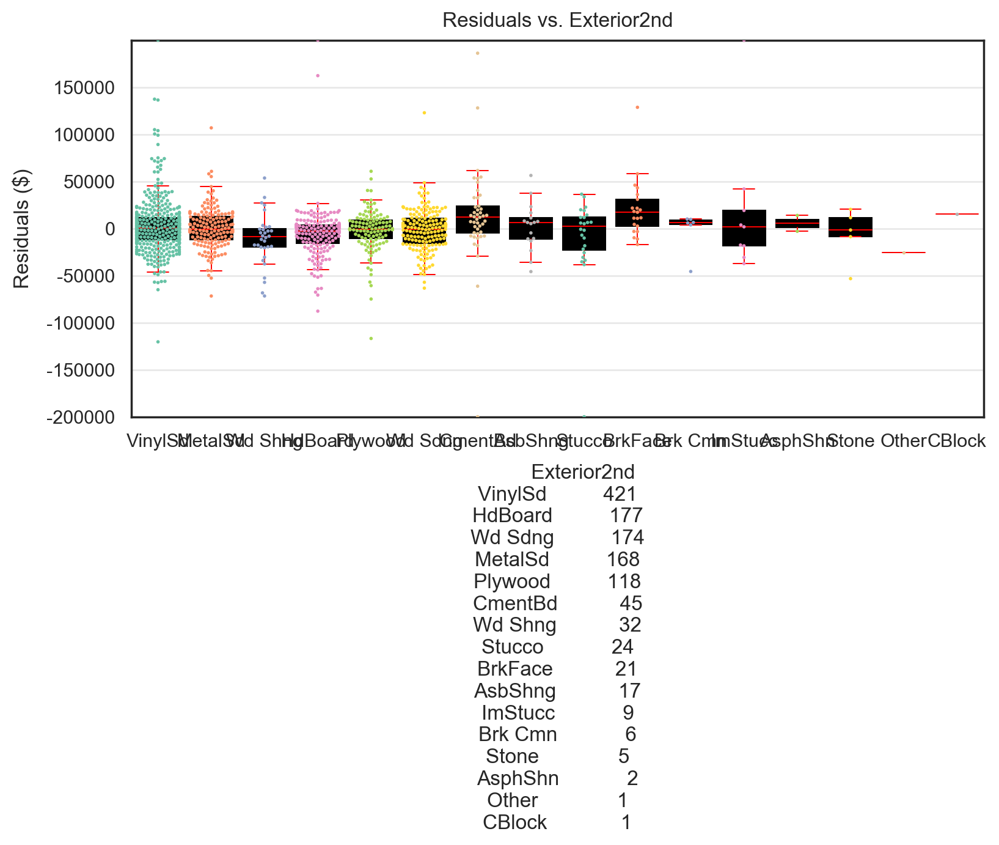

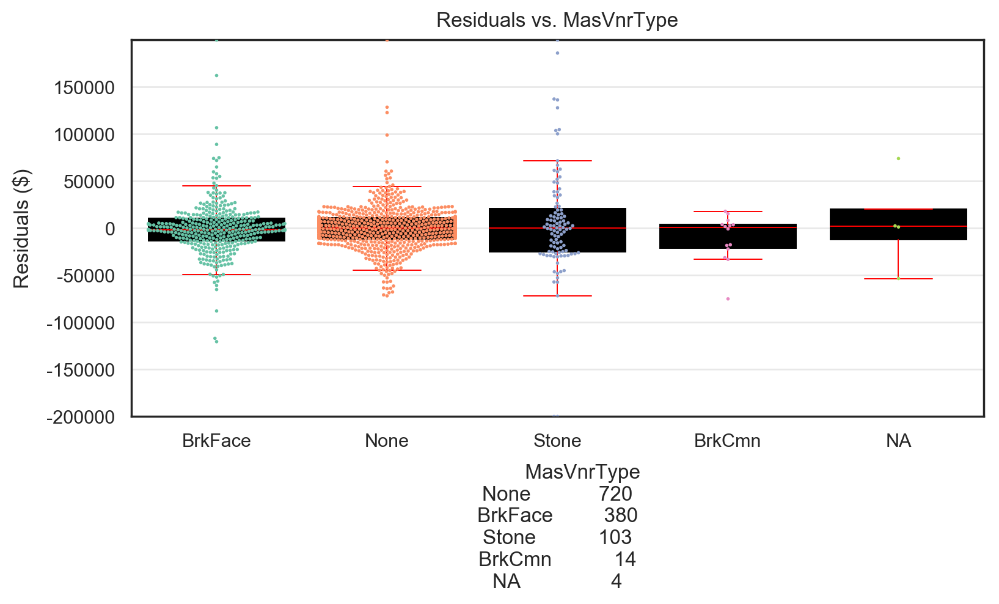

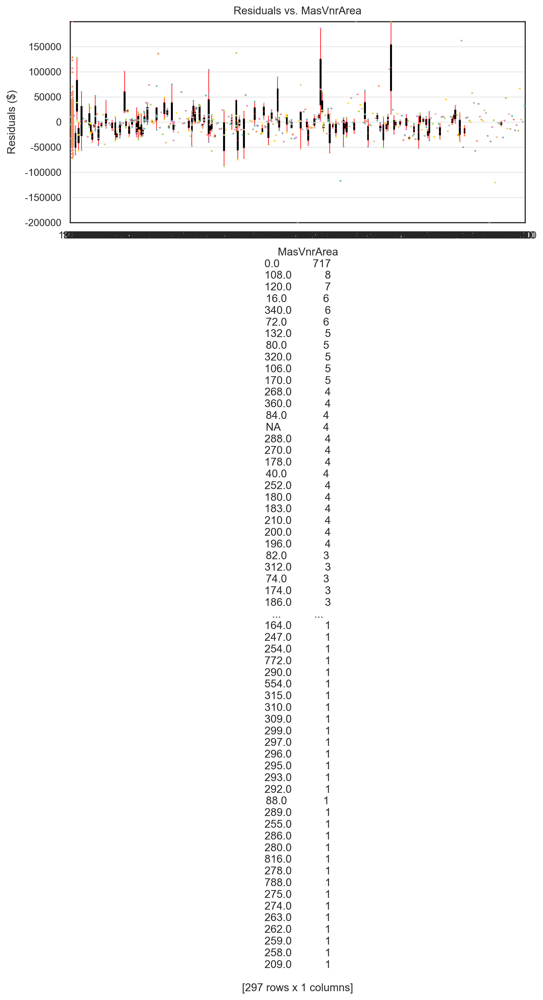

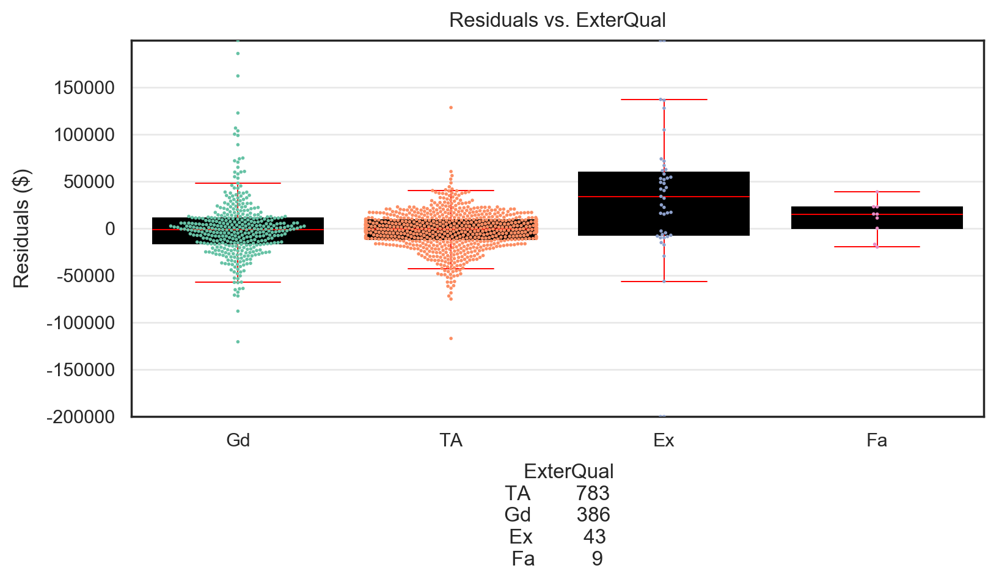

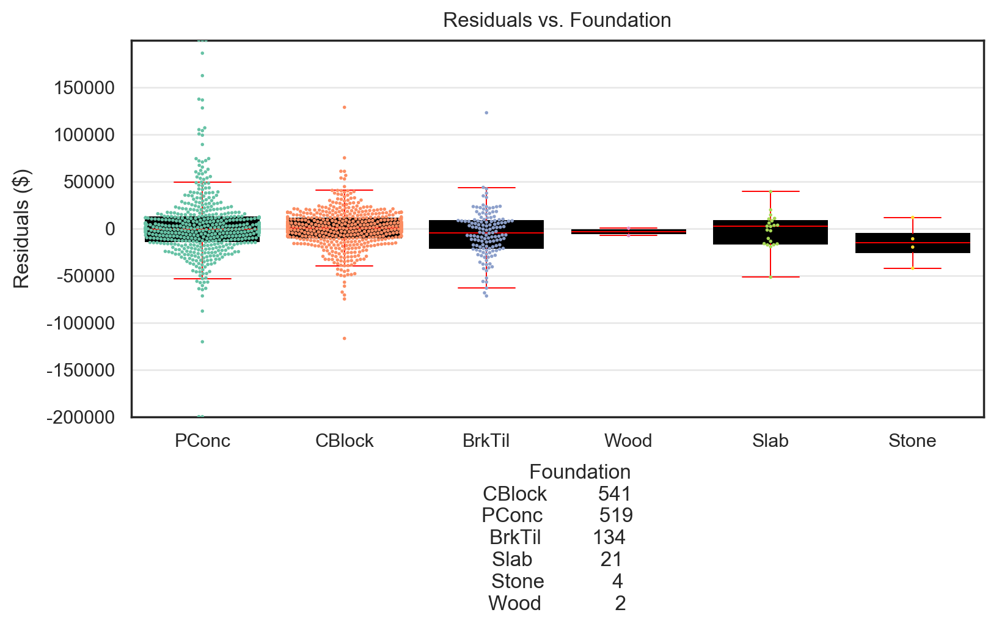

...

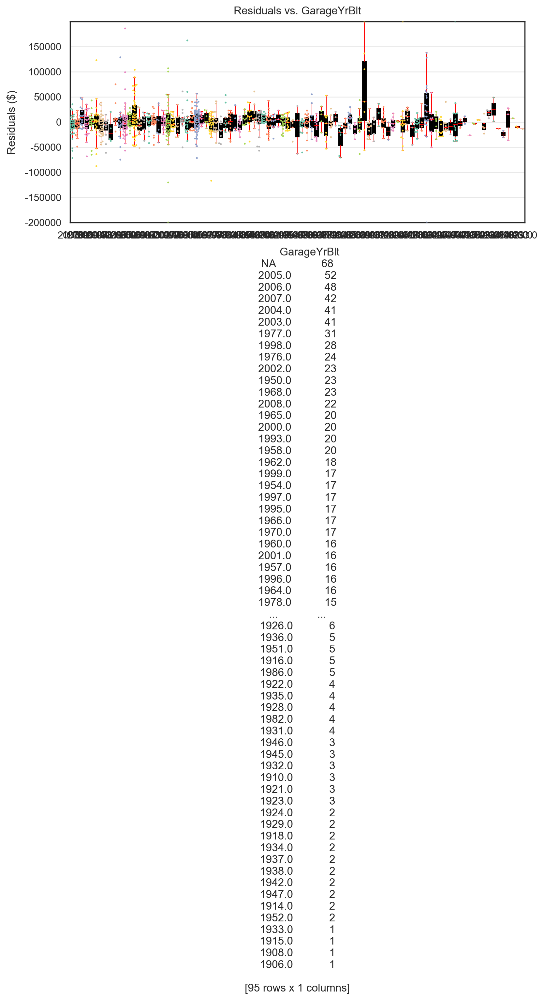

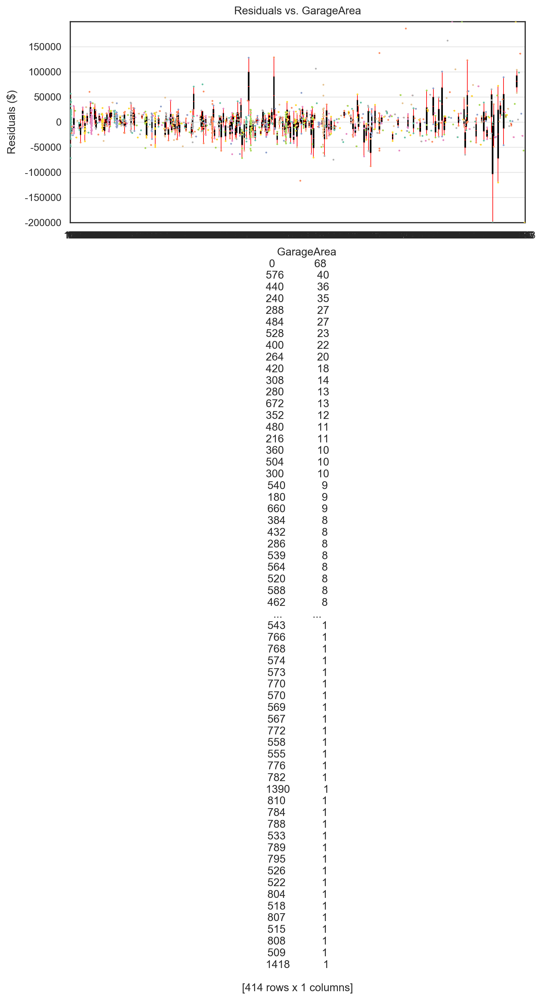

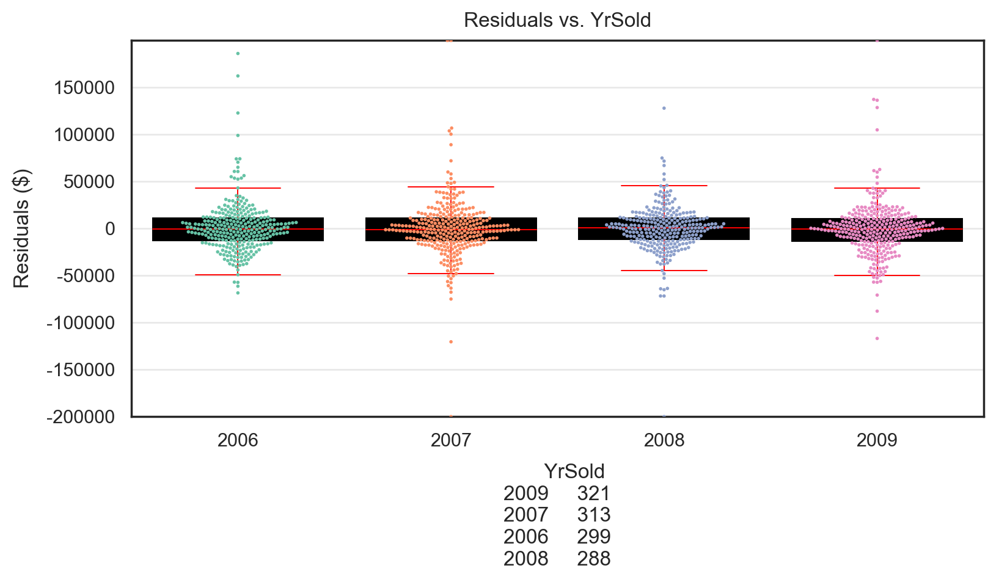

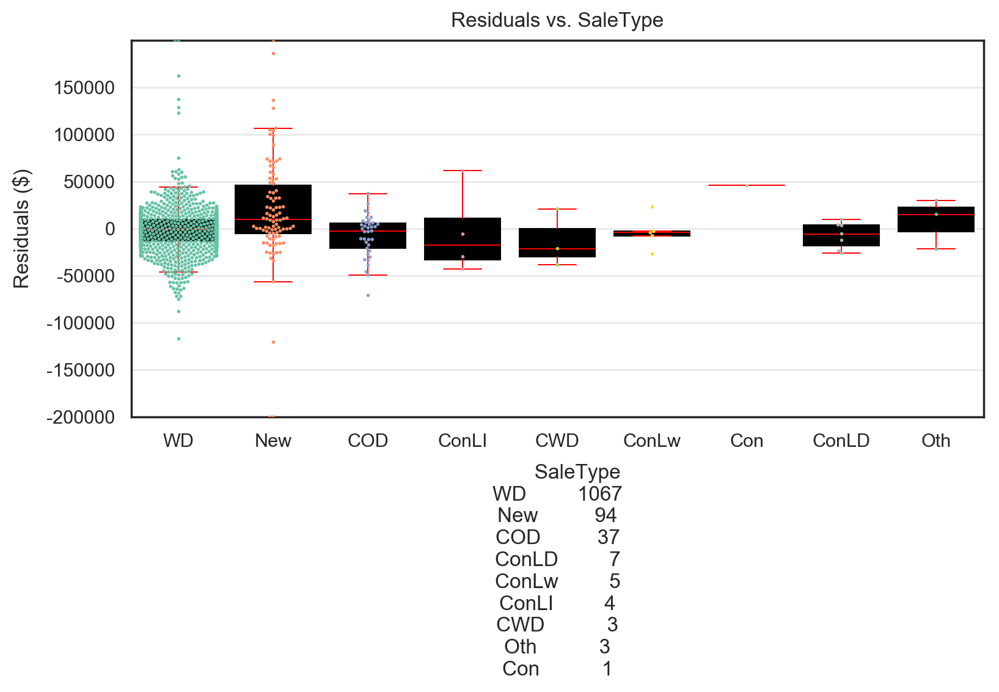

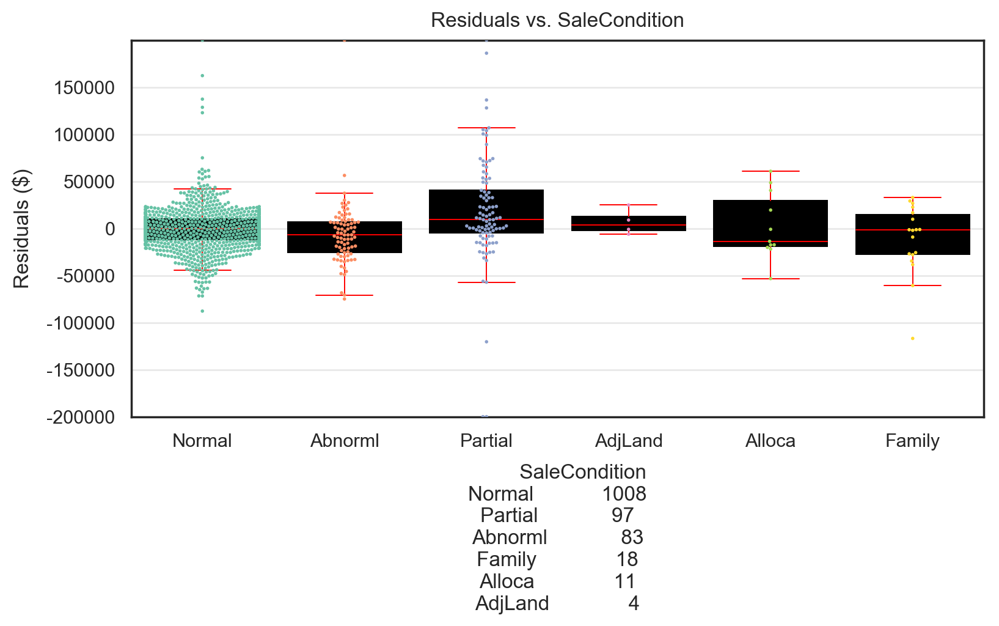

In [134]:
# For each categorical variable in the cat_cols_to_eda list, create a box and swarmplot, with the 
# value_counts for each field included in the x-axis label.  Skip first 2 numeric features.
reno_cat_cols_to_eda = list(house_reno_train.columns[2:])


for cat_var in reno_cat_cols_to_eda[:-1]:
    plot_price_boxplot(cat_var, house_reno_train.loc[:, reno_cat_cols_to_eda], 'Residuals')

As done when selecting fixed feature predictors earlier, I'm looking for categorical variables that demonstrate both: 1) a variation in residuals across their different values, and 2) have a 'reasonable' spread of datapoints across their different values.

There isn't a great deal of variation across these categorical predictors. The predictors that come closest to satisfying the 2 criteria above are:

- RoofStyle
- Exterior1st
- Exterior2nd
- BsmtFinType1
- KitchenQual
- Functional
- FirePlaceQual
- GarageQual
- GarageCond

Will include in the predictor matrix, along with OverallQual and OverallCond. Even though the correlation between the residuals and OverallQual and OverallCond is relatively low, it feels appropriate that these may contribute to variance/residuals from the predicted sales prices.  Make sense to check the overall Quality of the house and as to how much renovatable the house are, the better quality the lesser the cost of renovations.

### Train and evaluate Linear Regression model to predict sales price residuals

#### Define predictor and target

In [184]:
# Create dictionary look up of column names and indexes from the house_reno_train df
col_indexes = dict(enumerate(house_reno_train.columns))
print(col_indexes)

{0: 'YearBuilt', 1: 'Exterior1st', 2: 'Exterior2nd', 3: 'MasVnrType', 4: 'MasVnrArea', 5: 'ExterQual', 6: 'Foundation', 7: 'BsmtQual', 8: 'BsmtFinType1', 9: 'BsmtFinType2', 10: 'BsmtUnfSF', 11: 'CentralAir', 12: 'Electrical', 13: '1stFlrSF', 14: '2ndFlrSF', 15: 'Functional', 16: 'FireplaceQu', 17: 'GarageYrBlt', 18: 'GarageArea', 19: 'YrSold', 20: 'SaleType', 21: 'SaleCondition', 22: 'Residuals'}


In [185]:
# Identify column indexes to include in predictor matrix
predictor_col_indexes = [0, 1, 2, 4, 5, 10, 16, 17, 18, 20, 21]
predictor_col_names = [col_indexes[key] for key in predictor_col_indexes]

In [186]:
# Define predictor matrices and target arrays
X_house_reno_train = house_reno_train[predictor_col_names]
X_house_reno_test = house_reno_test[predictor_col_names]

y_residuals_train = train_residuals
y_residuals_test = test_residuals

Before dummifying the categorical features, we need to stack the train and test data as the same feature values may not exist in the train and test data. Dumifying the data separately may result in dataframes of different dimensions.

In [187]:
# Reset indexes to enable train and test data to be easily extracted after concatenation and dummifying
X_house_reno_train.reset_index(inplace=True, drop=True)
X_house_reno_test.reset_index(inplace=True, drop=True)

X_house_reno = pd.concat([X_house_reno_train, X_house_reno_test], axis=0)

In [216]:
# Dumify categorical variables in predictor data, dropping the first value for each field
X_house_reno = pd.get_dummies(X_house_reno, drop_first=True)

# Re-split train and test feature data
X_house_reno_train= X_house_reno.iloc[:1221,:]
X_house_reno_test= X_house_reno.iloc[1221:,:]

In [206]:
# Confirm that data types and shape are as expected
print(type(X_house_reno_train), type(X_house_reno_test), type(y_residuals_train), type(y_residuals_test))
print(X_house_reno_train.shape, X_house_reno_test.shape, y_residuals_train.shape, y_residuals_test.shape)

<class 'pandas.core.frame.DataFrame'> <class 'pandas.core.frame.DataFrame'> <class 'pandas.core.series.Series'> <class 'pandas.core.series.Series'>
(1221, 469) (164, 469) (1221,) (164,)


#### Data frame shapes fixed

In [207]:
# Standardise my predictor
# Take mean and std of train data only, and transform both train and test data with it
ss = StandardScaler()

Xr_train_ss = ss.fit_transform(X_house_reno_train)
Xr_test_ss = ss.transform(X_house_reno_test)

In [142]:
# Take a quick look at standardised predictors to ensure no suprises
pd.DataFrame(Xr_train_ss, columns=X_house_reno_train.columns).describe()

,YearBuilt,BsmtUnfSF,GarageArea,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,...,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
count,1.220000e+03,1.220000e+03,1.220000e+03,1220.0,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,...,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03,1.220000e+03
mean,1.564322e-15,4.213387e-17,9.185503e-18,0.0,1.671250e-16,2.151740e-16,1.704636e-16,-8.058217e-17,1.553402e-16,1.478838e-16,...,-2.528146e-16,2.996010e-16,1.042882e-16,6.976091e-16,5.396412e-17,-3.110558e-16,1.459898e-16,-1.165507e-16,-7.430304e-17,1.633484e-16
std,1.000410e+00,1.000410e+00,1.000410e+00,0.0,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,...,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00,1.000410e+00
min,-3.256719e+00,-1.270476e+00,-2.174366e+00,0.0,-4.052204e-02,-1.841149e-01,-2.864166e-02,-1.979452e-01,-4.335043e-01,-2.864166e-02,...,-5.735393e-02,-6.415003e-02,-2.889314e-01,-4.964955e-02,-2.630984e+00,-5.735393e-02,-9.538568e-02,-1.223726e-01,-2.174327e+00,-2.938976e-01
25%,-5.989064e-01,-7.851322e-01,-7.203848e-01,0.0,-4.052204e-02,-1.841149e-01,-2.864166e-02,-1.979452e-01,-4.335043e-01,-2.864166e-02,...,-5.735393e-02,-6.415003e-02,-2.889314e-01,-4.964955e-02,3.800859e-01,-5.735393e-02,-9.538568e-02,-1.223726e-01,4.599123e-01,-2.938976e-01
50%,6.554666e-02,-2.012643e-01,4.298004e-03,0.0,-4.052204e-02,-1.841149e-01,-2.864166e-02,-1.979452e-01,-4.335043e-01,-2.864166e-02,...,-5.735393e-02,-6.415003e-02,-2.889314e-01,-4.964955e-02,3.800859e-01,-5.735393e-02,-9.538568e-02,-1.223726e-01,4.599123e-01,-2.938976e-01
75%,9.625583e-01,5.460641e-01,4.843426e-01,0.0,-4.052204e-02,-1.841149e-01,-2.864166e-02,-1.979452e-01,-4.335043e-01,-2.864166e-02,...,-5.735393e-02,-6.415003e-02,-2.889314e-01,-4.964955e-02,3.800859e-01,-5.735393e-02,-9.538568e-02,-1.223726e-01,4.599123e-01,-2.938976e-01
max,1.294785e+00,3.960264e+00,4.370858e+00,0.0,2.467793e+01,5.431390e+00,3.491418e+01,5.051905e+00,2.306782e+00,3.491418e+01,...,1.743560e+01,1.558846e+01,3.461029e+00,2.014117e+01,3.800859e-01,1.743560e+01,1.048375e+01,8.171767e+00,4.599123e-01,3.402546e+00


Mean and standard deviation of each feature is 0 and 1 respectively, as expected after standardisation.

### Train and evaluate Linear Regression Model

In [208]:
# Start by fitting a linear regression on training data (pre-2010 sales) without 
# any cross-validation or regularization, and evaluate R2 score on both train and test data

lnr_r = LinearRegression()
lnr_r.fit(X_train_ss, y_residuals_train)
print(f'R2 score on training data: {round(lnr.score(X_train_ss, y_train),3)}')
print(f'R2 score on test data: {round(lnr.score(X_test_ss, y_test),3)}')

R2 score on training data: -5.057
R2 score on test data: -4.744


Model reports a large negative R2 score on the training data, and large negative R2 score on the test data, seems like not generalised well to the test data. My guess is that the model has overfitted the training data.

### Lasso regularsation

In [210]:
# Perform lasso regularisation grid search

lasso_r = LassoCV(alphas=np.logspace(-4,3,5000), cv=KFold(n_splits=5, shuffle=True, random_state=5), verbose=1, max_iter=10000)
lasso_r.fit(Xr_train_ss, y_residuals_train)

print('Optimal Lasso R2 score:', round(lasso_r.score(Xr_train_ss, y_residuals_train),3))
print('Best alpha:', round(lasso_r.alpha_,3))

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

........................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

........................................................................................................................................................................................................................................................................................................................................................................................................

Optimal Lasso R2 score: 0.376
Best alpha: 1000.0


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  4.5min finished


The R2 score on the training data is higher than the standard Linear Regression. Hopefully this results in a model that generalises better to the training data.

In [211]:
# Score optimum lasso model on test data 
print('R2 score of optimum Lasso on test data:', round(lasso_r.score(Xr_test_ss, y_residuals_test),3))

R2 score of optimum Lasso on test data: 0.041


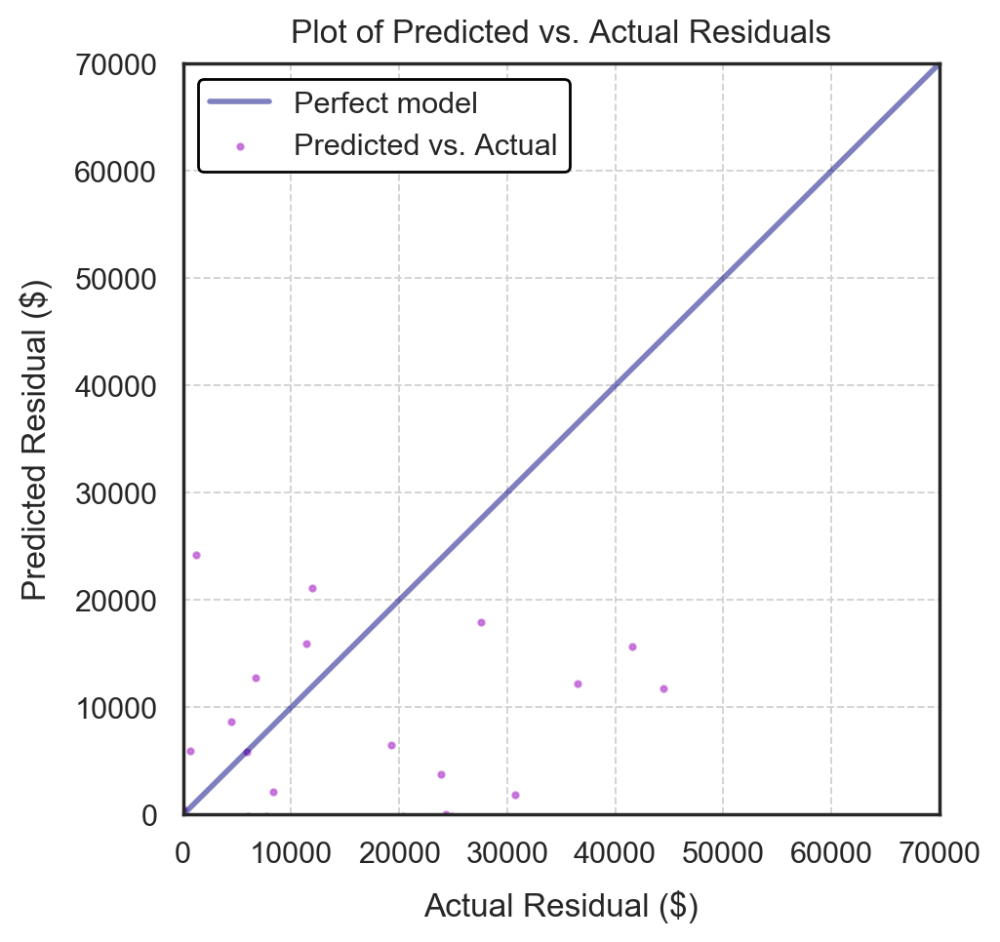

In [213]:
# Plot predictions for test data residuals from optimum lasso model vs actual residuals
predictions_r = lasso_r.predict(Xr_test_ss)

plt.figure(figsize=(5,5))

plt.scatter(y_residuals_test, predictions_r, color='mediumorchid', s=4, label='Predicted vs. Actual', alpha=0.7 )

# Plot 'perfect model' (x=y) line on plot
plt.plot([0, 70000], [0, 70000], color='navy',
        linewidth=2.0, alpha=0.5, label='Perfect model', )

# Add grid to plot
plt.grid(color='lightgrey', linewidth=0.7, linestyle='--')

plt.xlabel('Actual Residual ($)')
plt.xlim(0,70000)

plt.ylabel('Predicted Residual ($)')
plt.ylim(0,70000)

plt.title('Plot of Predicted vs. Actual Residuals')
plt.legend(loc='upper left') 
plt.show()

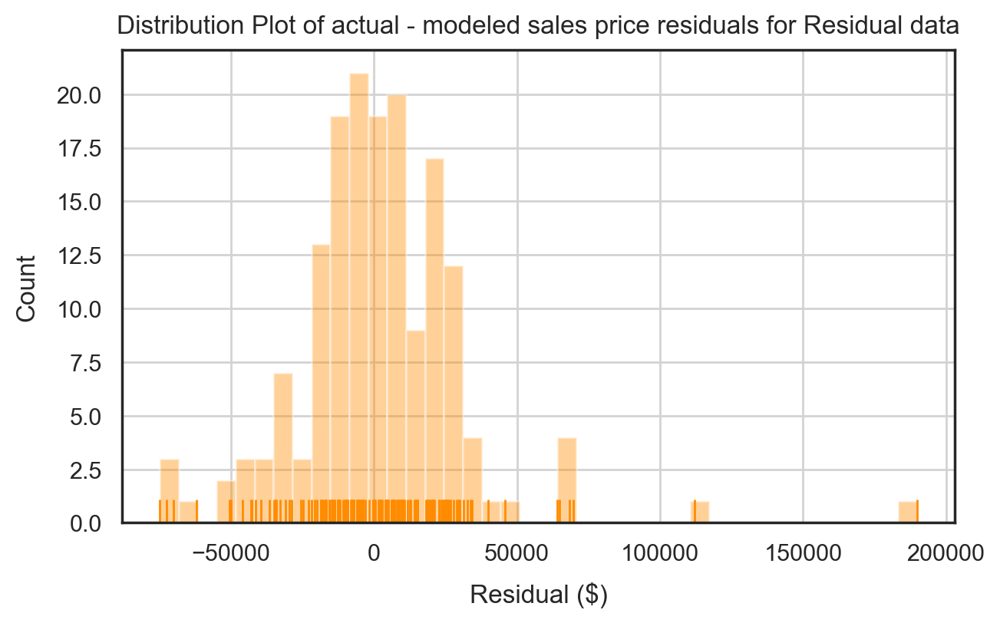

In [214]:
# Call function to plot hisotgram of difference between actual and predicted residuals
plot_residuals_hist(y_residuals_test-predictions_r, 'Residual')

In the plot above, we see that the R2 score will have been significantly impacted by a small number of outliers.

In [220]:
X_dumified.columns

Index(['YearRemodAdd', 'TotalBsmtSF', 'GrLivArea', 'GarageCars', 'Fireplaces',
       'WoodDeckSF', 'OpenPorchSF', 'OverallQual', 'OverallCond', 'BsmtFinSF1',
       'OpenPorchSF', 'Neighborhood_Blueste', 'Neighborhood_BrDale',
       'Neighborhood_BrkSide', 'Neighborhood_ClearCr', 'Neighborhood_CollgCr',
       'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_Gilbert',
       'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_Mitchel',
       'Neighborhood_NAmes', 'Neighborhood_NPkVill', 'Neighborhood_NWAmes',
       'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_OldTown',
       'Neighborhood_SWISU', 'Neighborhood_Sawyer', 'Neighborhood_SawyerW',
       'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Neighborhood_Timber',
       'Neighborhood_Veenker', 'LotShape_IR2', 'LotShape_IR3', 'LotShape_Reg',
       'LandContour_HLS', 'LandContour_Low', 'LandContour_Lvl',
       'Utilities_NoSeWa', 'LotConfig_CulDSac', 'LotConfig_FR2',
       'LotConfig_F

In [221]:
# Define dataframe with predictor coefficients in the optimimum Lasso modl
lasso_r_coeffs = pd.DataFrame({'Feature': X_house_reno.columns,
                             'Coef': lasso_r.coef_,
                             'Abs_coef': np.abs(lasso_r.coef_)})

lasso_r_coeffs.sort_values('Abs_coef', inplace=True, ascending=False)

In [223]:
# Look at 10 most important/largest coefficients
lasso_r_coeffs.head(10)

,Feature,Coef,Abs_coef
339,MasVnrArea_796.0,-5586.315130,5586.315130
335,MasVnrArea_762.0,-5305.739489,5305.739489
349,MasVnrArea_1170.0,4924.920523,4924.920523
461,SaleType_New,4439.289990,4439.289990
350,MasVnrArea_1378.0,3805.494653,3805.494653
276,MasVnrArea_424.0,3191.849150,3191.849150
279,MasVnrArea_428.0,-2759.424617,2759.424617
166,MasVnrArea_208.0,2733.544265,2733.544265
333,MasVnrArea_748.0,2348.294200,2348.294200
5,Exterior1st_BrkFace,2332.830432,2332.830432


In [224]:
# Look at 10 least important/smallest coefficients
lasso_r_coeffs.tail(10)

,Feature,Coef,Abs_coef
165,MasVnrArea_207.0,0.0,0.0
164,MasVnrArea_206.0,-0.0,0.0
163,MasVnrArea_205.0,0.0,0.0
162,MasVnrArea_204.0,0.0,0.0
161,MasVnrArea_203.0,-0.0,0.0
160,MasVnrArea_202.0,-0.0,0.0
158,MasVnrArea_196.0,-0.0,0.0
157,MasVnrArea_194.0,-0.0,0.0
156,MasVnrArea_192.0,-0.0,0.0
468,SaleCondition_Partial,0.0,0.0


As expected, the Lasso regularisation has zeroed a number of my predictor coefficients

In [225]:
print(f'Percent of predictor coefficients zeroed out by Lasso regularisation: \
{round((np.sum(lasso_r.coef_ == 0)/float(X_house_reno.shape[1])) * 100,2)}%.')

Percent of predictor coefficients zeroed out by Lasso regularisation: 84.22%.


84% of predictor coefficients were zeroed out by the Lasso regularisation confirming the speculation above that the model was overfitting the training data.  Almost nothing left from the predictor

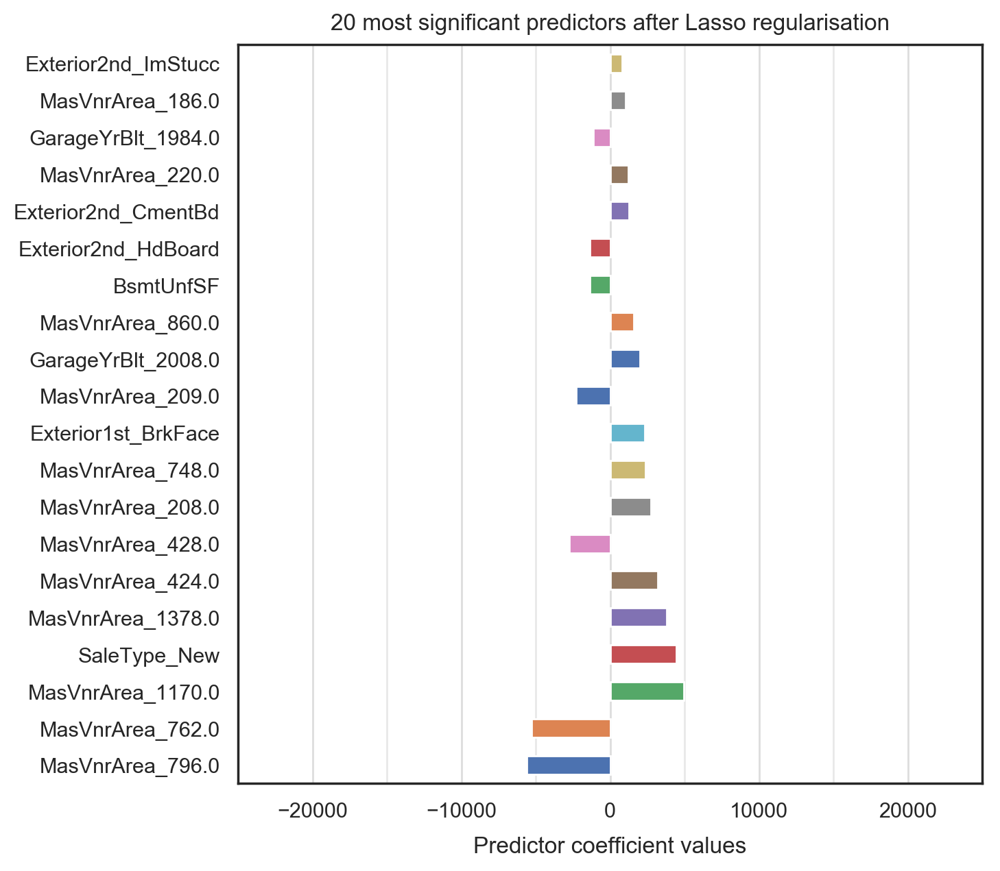

In [226]:
# Plot 20 largest coefficients
fig, ax = plt.subplots(figsize=(7,7))
title = '20 most significant predictors after Lasso regularisation'
lasso_r_coeffs.Coef[:20].plot(kind='barh', ax=ax)
ax.set_yticklabels(lasso_r_coeffs.Feature[:20].values)
ax.set_xlabel('Predictor coefficient values')
ax.set_title(title)

# Add a vertical grid to the plot
ax.xaxis.grid(True, linestyle='-', which='both', color='lightgrey', alpha=0.5)
ax.set_xticks(range(-25000, 30000, 5000), minor=True)
plt.show()

The chart above provides further evidence as to why the model's accuracy in predicting the residuals is relatively poor.  2 of the 3 most important/significant predictors are OverallQual and OverallCond which both had a relatively low correlation with the target (residuals) itself!  With Lasso it was completely removed from the predictions.

We are predicting the dollar amount now, but note it is in terms of ERRORS of the first model. If the first model overestimated the price for a house, then the error in price (residual) would be negative. We are predicting these residuals. The \-$5586 coefficient for MasVnrArea means this feature is "worth" -$5586 dollars i.e it is predicted to be \-$5586 dollars greater by the model.

Many of these features would do well to be converted onto a numeric scale to make them more interpretable.

I would not trust first model model either as an indicator of which properties to buy (based on their fixed features), then again I wouldn't trust a model's ability to accurately identify which properties to renovate and how. Fixed features can be identified better however  you need to know on average how much it cost to fix the selected areas.



<img src="http://imgur.com/GCAf1UX.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 3. What property characteristics predict an "abnormal" sale?

---

The `SaleCondition` feature indicates the circumstances of the house sale. From the data file, we can see that the possibilities are:

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)
       
One of the executives at your company has an "in" with higher-ups at the major regional bank. His friends at the bank have made him a proposal: if he can reliably indicate what features, if any, predict "abnormal" sales (foreclosures, short sales, etc.), then in return the bank will give him first dibs on the pre-auction purchase of those properties (at a dirt-cheap price).

He has tasked you with determining (and adequately validating) which features of a property predict this type of sale. 

---

**Your task:**
1. Determine which features predict the `Abnorml` category in the `SaleCondition` feature.
- Justify your results.

This is a challenging task that tests your ability to perform classification analysis in the face of severe class imbalance. You may find that simply running a classifier on the full dataset to predict the category ends up useless: when there is bad class imbalance classifiers often tend to simply guess the majority class.

It is up to you to determine how you will tackle this problem. I recommend doing some research to find out how others have dealt with the problem in the past. Make sure to justify your solution. Don't worry about it being "the best" solution, but be rigorous.

Be sure to indicate which features are predictive (if any) and whether they are positive or negative predictors of abnormal sales.

In [ ]:
# A: